In [ ]:
import tensorflow as tf
print(tf.__version__)

2.12.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
root_dir = "/content/drive/My Drive/Tesis/Desarrollo/"
print(root_dir)

MessageError: ignored

In [ ]:
base_dir = root_dir + 'ColeccionGrande/'
print(base_dir)

/content/drive/My Drive/Tesis/Desarrollo/ColeccionGrande/


In [ ]:
import h5py
import numpy as np
hf = h5py.File(base_dir + 'Datasets256.hdf5', 'r')

In [ ]:
img = np.array(hf.get('S_train')[0])

In [ ]:
img.shape

(256, 256, 4)

## **Importar datasets ya construídos:**

In [ ]:
import h5py
import numpy as np
hf = h5py.File(base_dir + 'Datasets256.hdf5', 'r')

S_train = np.array(hf.get('S_train')[8000:10000])
print('S_train cargado.')
S_test = np.array(hf.get('S_test')[2000:2500])
print('S_test cargado.')
P_train = np.array(hf.get('P_train')[8000:10000])
print('P_train cargado.')
P_test = np.array(hf.get('P_test')[2000:2500])
print('P_test cargado.')

print(S_train.shape, S_test.shape, P_train.shape, P_test.shape)

S_train cargado.
S_test cargado.
P_train cargado.
P_test cargado.
(2000, 256, 256, 4) (500, 256, 256, 4) (2000, 256, 256) (500, 256, 256)


In [ ]:
P_train = P_train.reshape((-1, 256, 256, 1))
P_test = P_test.reshape((-1, 256, 256, 1))

In [ ]:
print(S_train.shape, S_test.shape, P_train.shape, P_test.shape)

(2000, 256, 256, 4) (500, 256, 256, 4) (2000, 256, 256, 1) (500, 256, 256, 1)


## **Construcción de la red neuronal tipo UNET**

**Una vez se tienen las entradas(S) y salidas(P) definidas, se realiza el diseño de una arquitectura de red neuronal por medio de Tensorflow:**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from keras.layers import concatenate
from keras.layers import UpSampling2D
from keras.layers import Input, Dropout
from tensorflow.keras import Model

In [ ]:
from keras.layers import Activation, BatchNormalization, Conv2D, UpSampling2D, Conv2DTranspose, Concatenate
from keras.layers import MaxPooling2D, Dropout, Input, AveragePooling2D, Reshape, Permute, UpSampling2D
from keras.layers import SimpleRNN, Bidirectional, LSTM
from keras.layers import Lambda
from keras.models import load_model, Model
from keras.losses import sparse_categorical_crossentropy
import tensorflow as tf

from keras.optimizers import *
import keras.backend as K
import keras
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [ ]:
def encoder_block(input_layer, filters):
  x = Conv2D(filters, kernel_size=(3, 3), padding='same')(input_layer)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(filters, kernel_size=(3, 3), padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  return x

def decoder_block(join, input_layer, filters):
  x = Concatenate()([join, input_layer])
  x = Conv2D(filters, kernel_size=(3, 3), padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(filters, kernel_size=(3, 3), padding='same')(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  return x

def get_saltos():
    input = Input((256, 256, 4))

    #encoder
    e1 = encoder_block(input, 64)
    p1 = MaxPooling2D(pool_size=(2, 2))(e1)

    e2 = encoder_block(p1, 128)
    p2 = MaxPooling2D(pool_size=(2, 2))(e2)

    e3 = encoder_block(p2, 256)
    p3 = MaxPooling2D(pool_size=(2, 2))(e3)

    e4 = encoder_block(p3, 512)
    p4 = MaxPooling2D(pool_size=(2, 2))(e4)

    #Center
    center = encoder_block(p4, 1024)

    # decoder Network
    u4 = UpSampling2D(size=(2, 2))(center)
    u4 = decoder_block(e4, u4, 512)

    u3 = UpSampling2D(size=(2, 2))(u4)
    u3 = decoder_block(e3, u3, 256)

    u2 = UpSampling2D(size=(2, 2))(u3)
    u2 = decoder_block(e2, u2, 128)

    u1 = UpSampling2D(size=(2, 2))(u2)
    u1 = decoder_block(e1, u1, 64)

    outputs = Conv2D(1, (1, 1), activation='tanh')(u1)

    model = Model(inputs=input, outputs=outputs)

    return model

In [ ]:
from tensorflow.keras.optimizers import Adam
model = get_saltos()

model_id = 'UNetSaltos_100e_4b_256_10000'
model_path = '/content/drive/My Drive/Tesis/Desarrollo/Modelos/UNetTradicional/{}.h5'.format(model_id)

earlystopper = EarlyStopping(
    monitor='val_loss',
    patience=5,
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    model_path,
    monitor='val_loss',
    verbose=1,
    save_best_only=True
)

In [ ]:
model = tf.keras.models.load_model('/content/drive/My Drive/Tesis/Desarrollo/Modelos/UNetTradicional/UNetSaltos_100e_4b_256_10000.h5', compile = False)

In [ ]:
loss = "mean_squared_error"

model.compile(optimizer="Adam", loss = loss)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 4  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  2368        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
history = model.fit(S_train, P_train, validation_data=(S_test, P_test), epochs=100, batch_size=4, callbacks=[model_checkpoint, earlystopper])

Epoch 1/100
500/500 [==============================] - ETA: 0s - loss: 1.6462e-04
Epoch 1: val_loss improved from inf to 0.00047, saving model to /content/drive/My Drive/Tesis/Desarrollo/Modelos/UNetTradicional/UNetSaltos_100e_4b_256_10000.h5
500/500 [==============================] - 194s 327ms/step - loss: 1.6462e-04 - val_loss: 4.6971e-04
Epoch 2/100
500/500 [==============================] - ETA: 0s - loss: 1.6814e-04
Epoch 2: val_loss improved from 0.00047 to 0.00030, saving model to /content/drive/My Drive/Tesis/Desarrollo/Modelos/UNetTradicional/UNetSaltos_100e_4b_256_10000.h5
500/500 [==============================] - 165s 330ms/step - loss: 1.6814e-04 - val_loss: 2.9883e-04
Epoch 3/100
500/500 [==============================] - ETA: 0s - loss: 1.9444e-04
Epoch 3: val_loss did not improve from 0.00030
500/500 [==============================] - 160s 319ms/step - loss: 1.9444e-04 - val_loss: 4.5487e-04
Epoch 4/100
500/500 [==============================] - ETA: 0s - loss: 1.4896e

## **Funciones para mostrar resultados**

In [ ]:
min = h5py.File(base_dir + 'DatasetsMin.hdf5', 'r')
max = h5py.File(base_dir + 'DatasetsMax.hdf5', 'r')

min_in = np.array(min.get('S_train'))
min_out = np.array(min.get('P_train'))
print('DatasetMin cargado.')

max_in = np.array(max.get('S_train'))
max_out = np.array(max.get('P_train'))
print('DatasetMax cargado.')

print(min_in.shape, min_out.shape, max_in.shape, max_out.shape)

DatasetMin cargado.
DatasetMax cargado.
(504, 256, 256, 4) (504, 256, 256) (504, 256, 256, 4) (504, 256, 256)


In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def loss_plot(history):
  loss = history.history['loss']
  epochs = np.arange(0, len(loss), 1)
  plt.plot(epochs, loss)
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.title("Epochs vs. Loss")
  plt.yscale("log")
  plt.grid()
  plt.show

In [ ]:
def overf_plot(history):
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Loss vs. epochs')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.yscale("log")
  plt.legend(['Training', 'Validation'], loc='upper right')
  plt.show()

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
def plot(*argv, titles=None):
  """
  plots a given number of phase maps
  """
  if len(argv) == 1:
    f, ax = plt.subplots(1, 1, sharey=True, figsize=(5, 5))
    if titles is not None:
      ax.set_title(titles)
    a = ax.imshow(argv[0].squeeze(), cmap='gray')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    f.colorbar(a, cax=cax)
    plt.show()
  else:
    f, axes = plt.subplots(1, len(argv), sharey=True, figsize=(10, 10))
    for i in range(len(argv)):
        if titles is not None:
          axes[i].set_title(titles[i])
        a = axes[i].imshow(argv[i].squeeze(), cmap='gray')
        divider = make_axes_locatable(axes[i])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        f.colorbar(a, cax=cax)
    plt.show()
    f.colorbar(a, cax=cax)

In [ ]:
def plot_hist(*argv, titles):
  """
  plots the historgram of the input phase maps
  """
  for i in range(len(argv)):
      hist = np.histogram(argv[i].ravel(), bins=100)
      plt.plot(hist[1][1:], hist[0])
  plt.xlabel("phase values")
  plt.ylabel("frequency")
  plt.title("Histogram Analysis")
  plt.grid()
  if titles is not None:
    plt.legend(titles)
  plt.show()

In [ ]:
def read_model(model, url, bs):
  model = model
  model.compile(optimizer="adam", loss = 'mse')

  model_path = '/content/drive/My Drive/Tesis/Desarrollo/Modelos/UNetTradicional/' + url
  model.load_weights(model_path)
  return model


In [ ]:
def show_results(model, url, bs):
  model = read_model(model, url, bs)
  y_pred = model.predict(S_test, batch_size=bs)
  idx = np.random.randint(0, S_test.shape[0])
  print(idx)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(S_test[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(P_test[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

In [ ]:
def show_results_min(model, url, bs, idx):
  model = read_model(model, url, bs)
  y_pred = model.predict(min_in, batch_size=bs)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(min_in[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(min_out[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

In [ ]:
def show_results_max(model, url, bs, idx):
  model = read_model(model, url, bs)
  y_pred = model.predict(max_in, batch_size=bs)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(max_in[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(max_out[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

## **Resultados de los modelos generados**

126/126 [==============================] - 22s 88ms/step


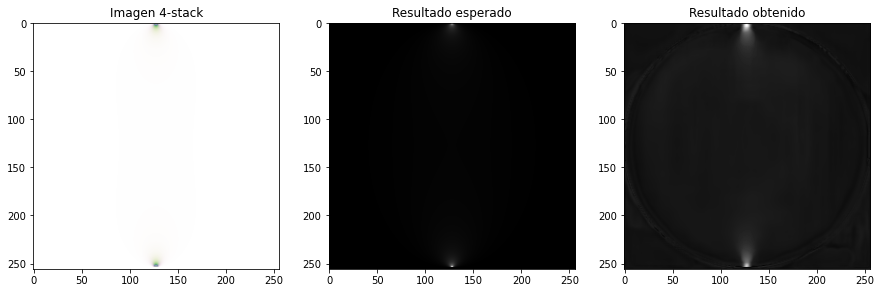

In [ ]:
show_results_min(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 0)

126/126 [==============================] - 12s 92ms/step


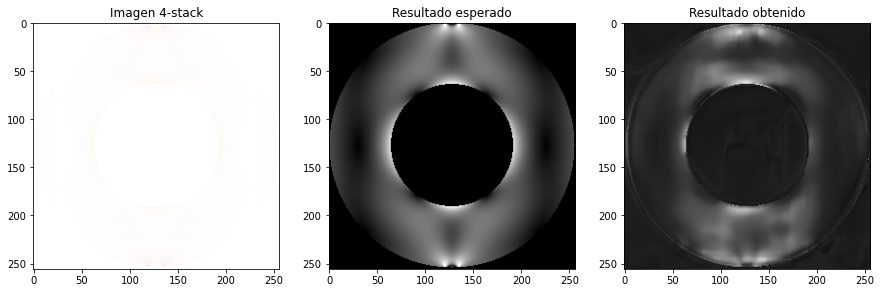

In [ ]:
show_results_min(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 100)

126/126 [==============================] - 13s 93ms/step


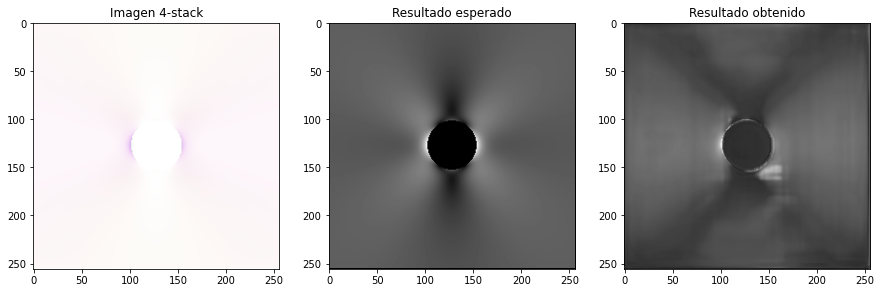

In [ ]:
show_results_min(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 200)

126/126 [==============================] - 12s 95ms/step


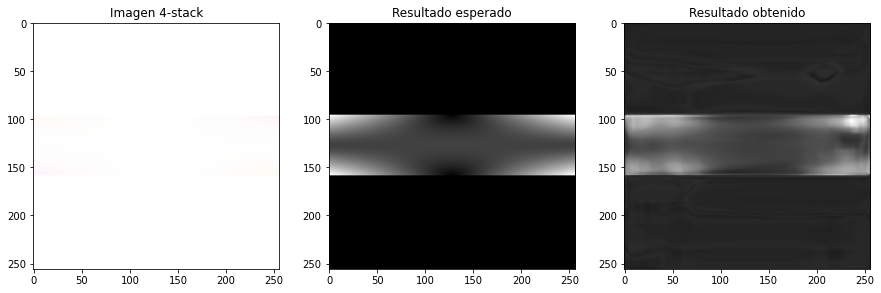

In [ ]:
show_results_min(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 300)

126/126 [==============================] - 12s 92ms/step


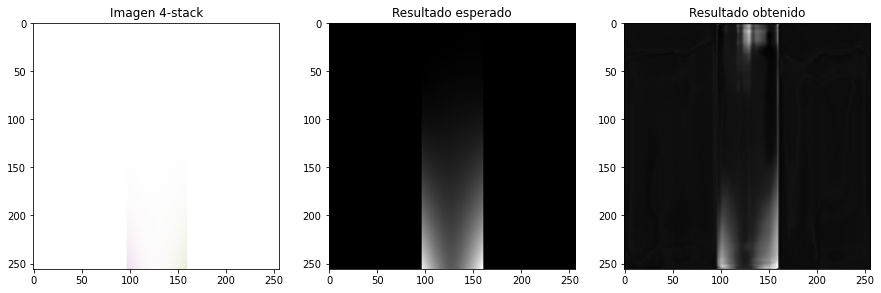

In [ ]:
show_results_min(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 400)

126/126 [==============================] - 12s 92ms/step


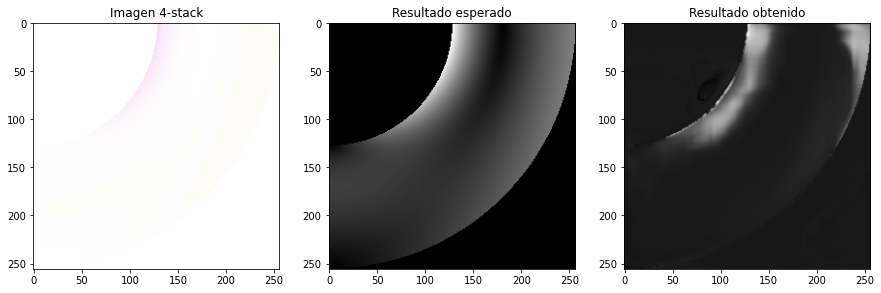

In [ ]:
show_results_min(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 500)

## **Máximo**

126/126 [==============================] - 12s 93ms/step


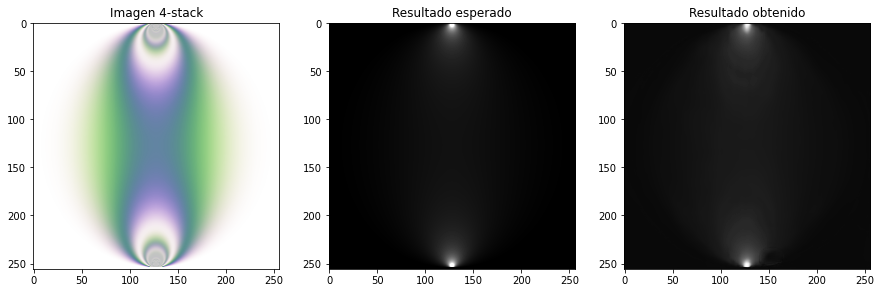

In [ ]:
show_results_max(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 0)

126/126 [==============================] - 12s 92ms/step


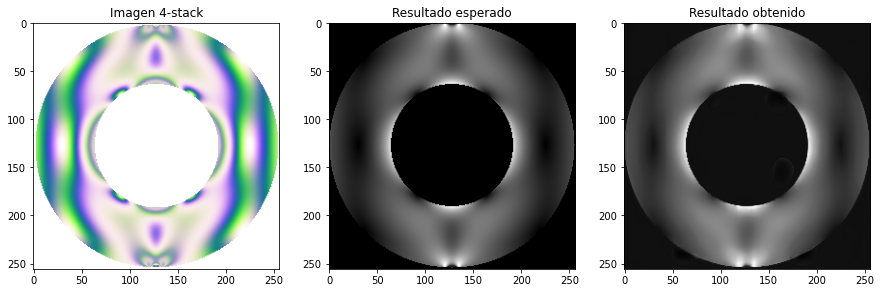

In [ ]:
show_results_max(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 100)

126/126 [==============================] - 12s 90ms/step


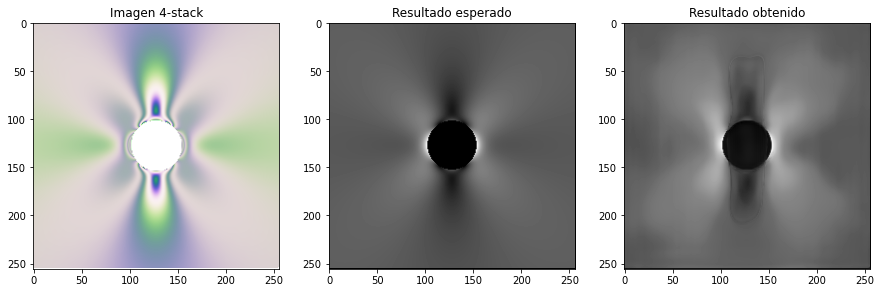

In [ ]:
show_results_max(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 200)

126/126 [==============================] - 12s 92ms/step


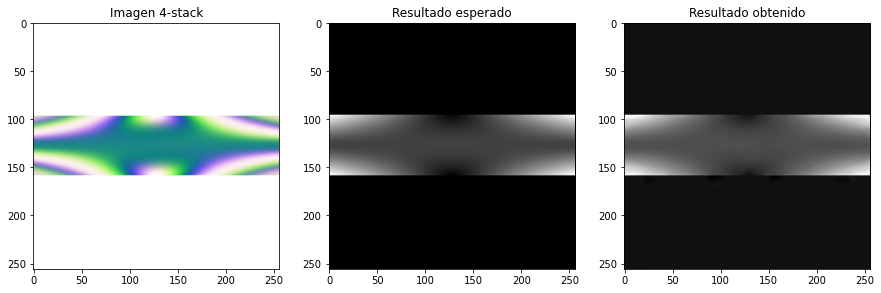

In [ ]:
show_results_max(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 300)

126/126 [==============================] - 12s 92ms/step


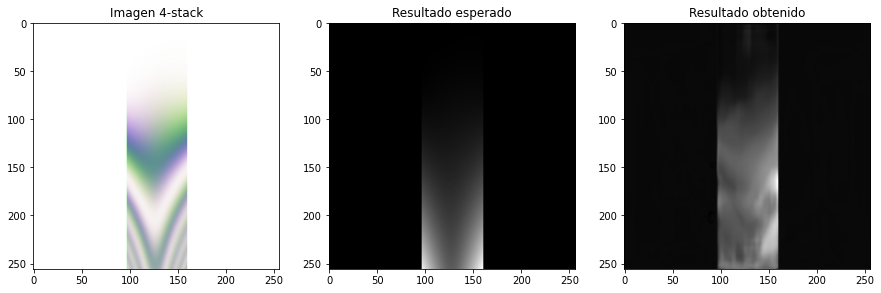

In [ ]:
show_results_max(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 400)

126/126 [==============================] - 12s 91ms/step


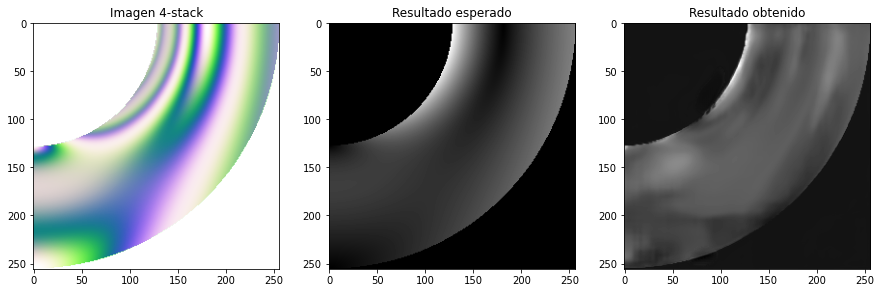

In [ ]:
show_results_max(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4, 500)

**Model8_100e_4b_256_2500**

125/125 [==============================] - 12s 91ms/step
443


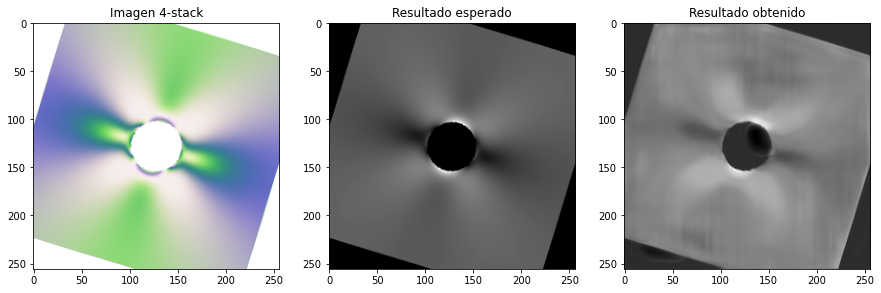

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_2000.h5', 4)

125/125 [==============================] - 12s 90ms/step
280


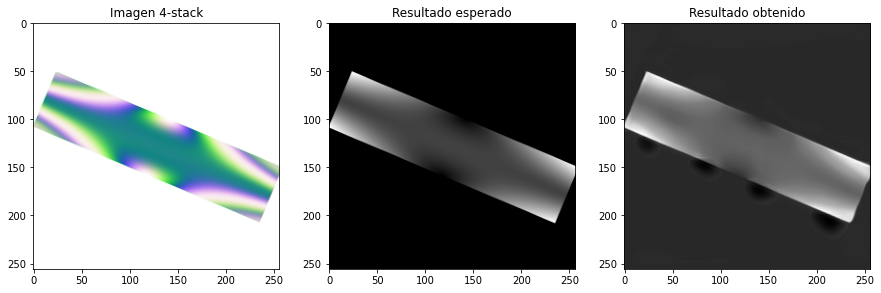

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_2000.h5', 4)

125/125 [==============================] - 12s 92ms/step
126


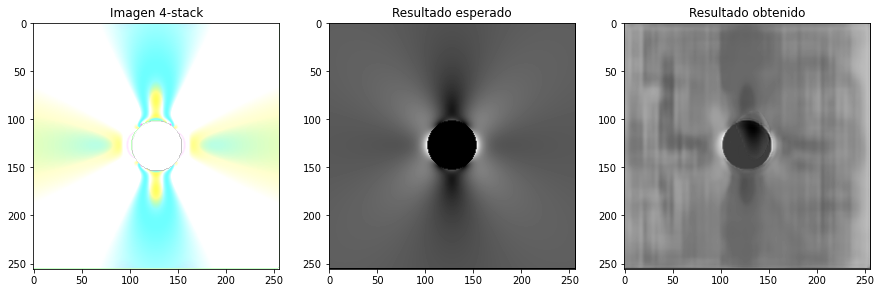

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_2000.h5', 4)

125/125 [==============================] - 12s 93ms/step
277


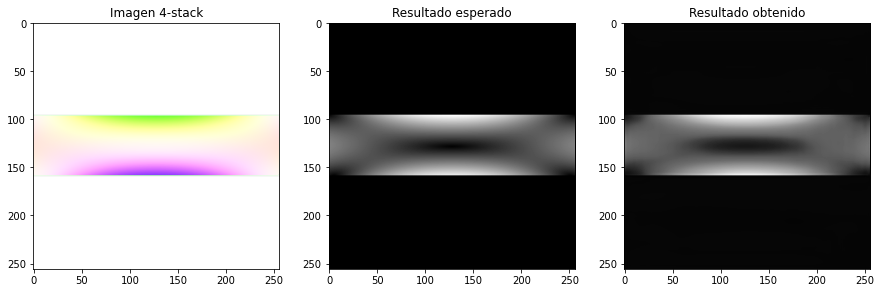

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_2000.h5', 4)

---

**Model8_100e_4b_256_5000**

157/157 [==============================] - 25s 92ms/step
599


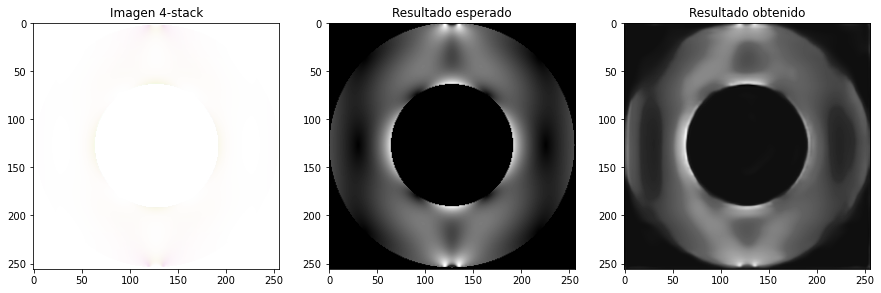

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_5000.h5', 4)

157/157 [==============================] - 14s 87ms/step
426


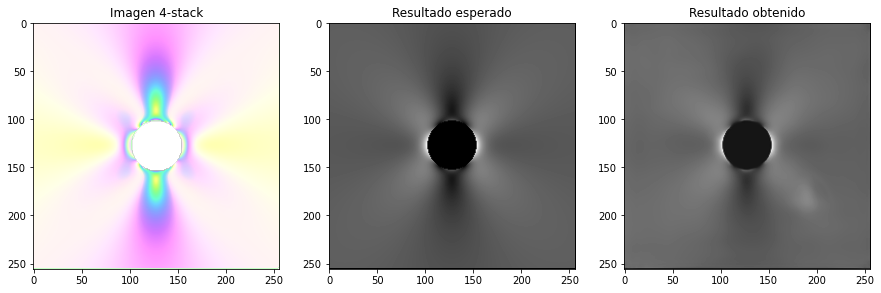

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_5000.h5', 4)

157/157 [==============================] - 15s 89ms/step
112


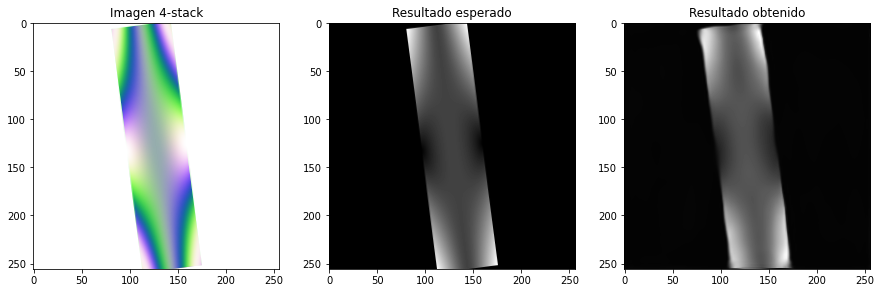

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_5000.h5', 4)

157/157 [==============================] - 15s 92ms/step
418


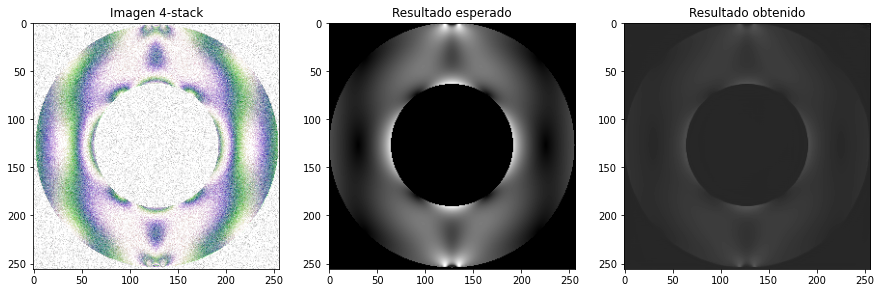

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_5000.h5', 4)

157/157 [==============================] - 15s 93ms/step
486


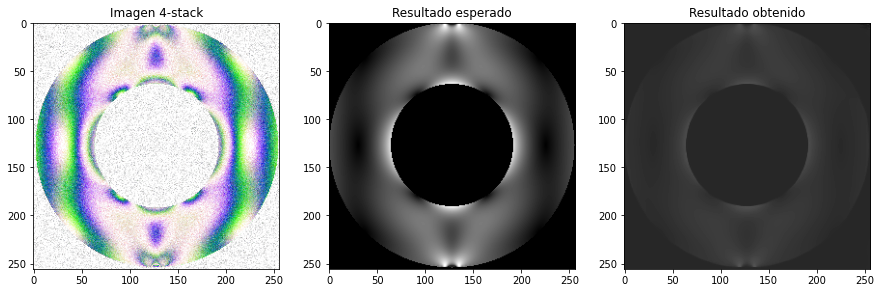

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_5000.h5', 4)

---

**Model8_100e_4b_256_7500**

157/157 [==============================] - 27s 92ms/step
569


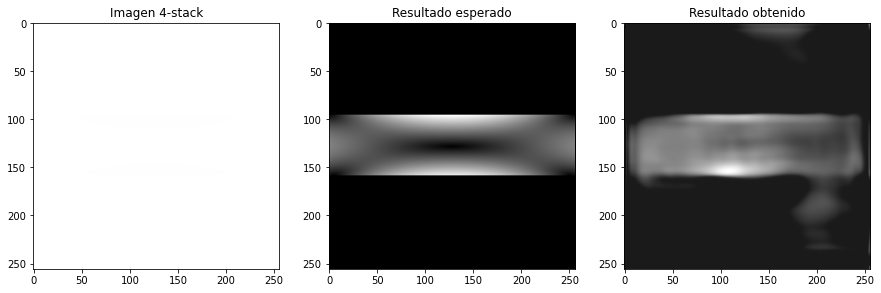

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

157/157 [==============================] - 14s 86ms/step
356


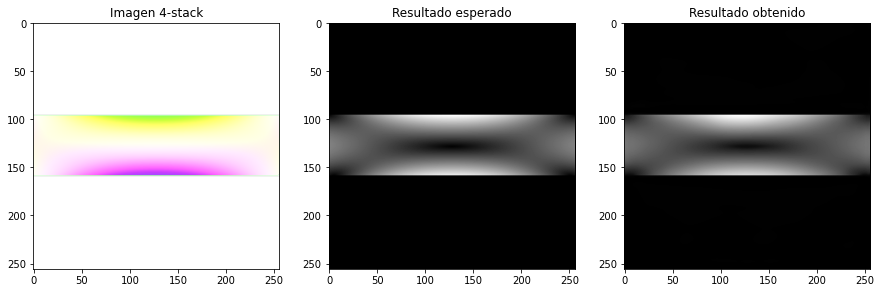

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

157/157 [==============================] - 14s 87ms/step
131


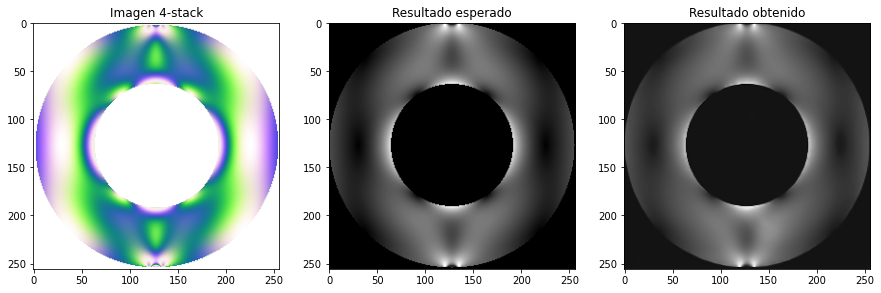

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

157/157 [==============================] - 14s 87ms/step
324


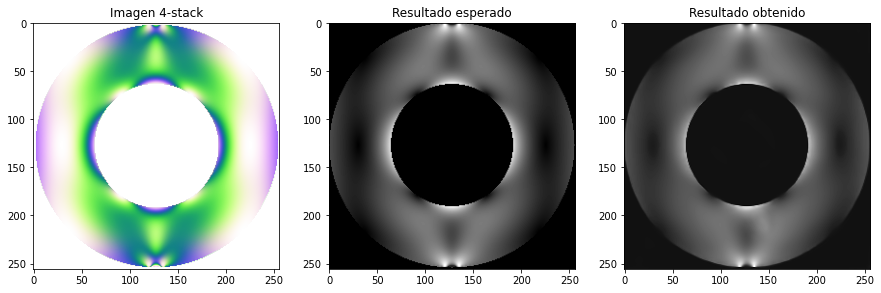

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

157/157 [==============================] - 15s 87ms/step
385


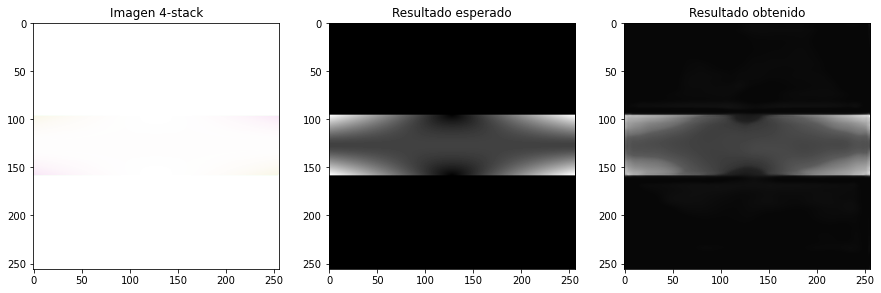

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

**Model8_100e_4b_256_10000**

125/125 [==============================] - 12s 92ms/step
237


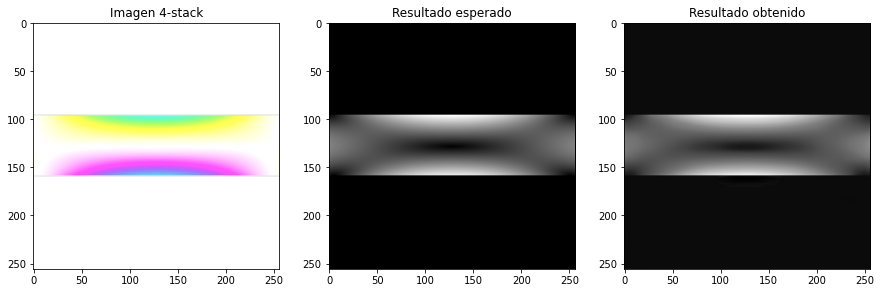

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4)

125/125 [==============================] - 12s 91ms/step
191


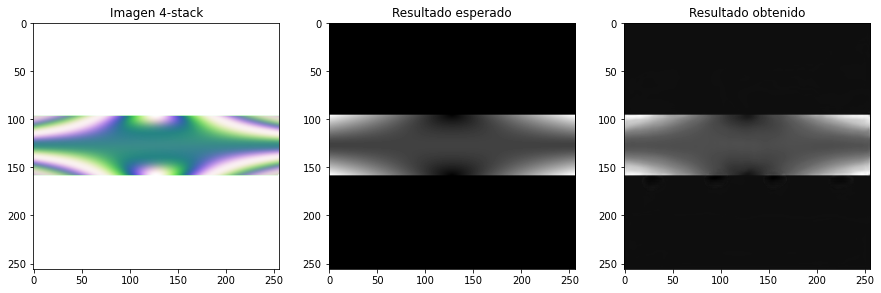

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4)

125/125 [==============================] - 12s 92ms/step
462


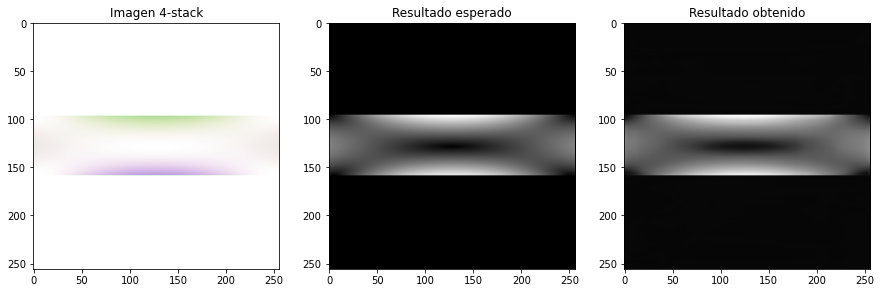

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4)

125/125 [==============================] - 12s 92ms/step
137


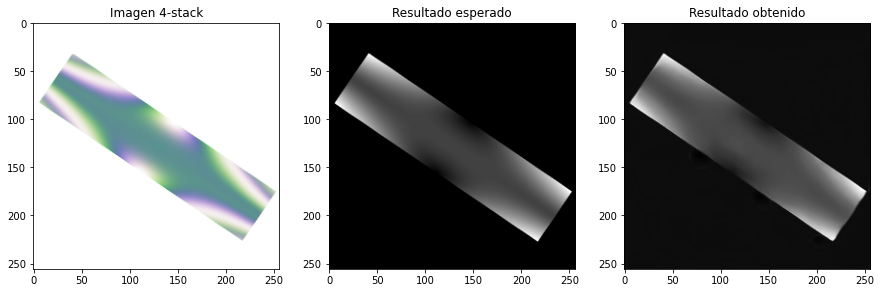

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4)

125/125 [==============================] - 12s 92ms/step
218


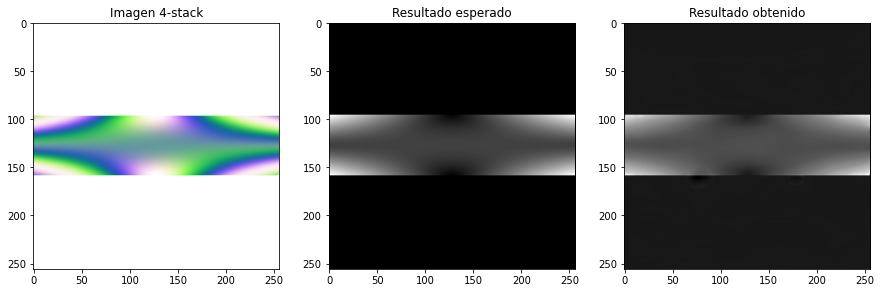

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4)

125/125 [==============================] - 12s 90ms/step
225


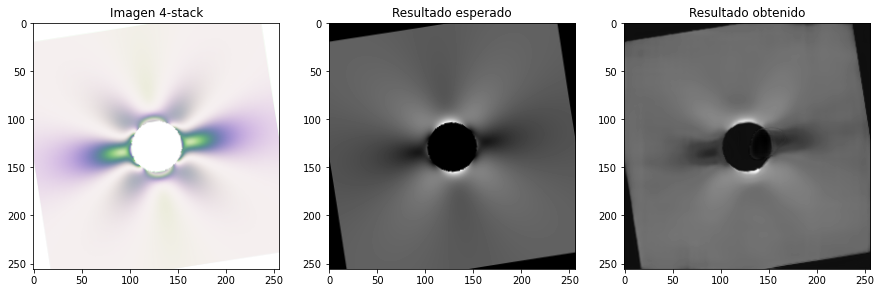

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4)

125/125 [==============================] - 12s 91ms/step
151


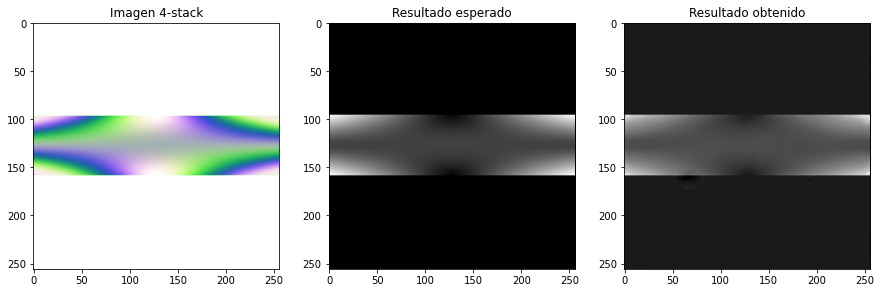

In [ ]:
show_results(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4)

**Model8_100e_4b_256_12500**

480


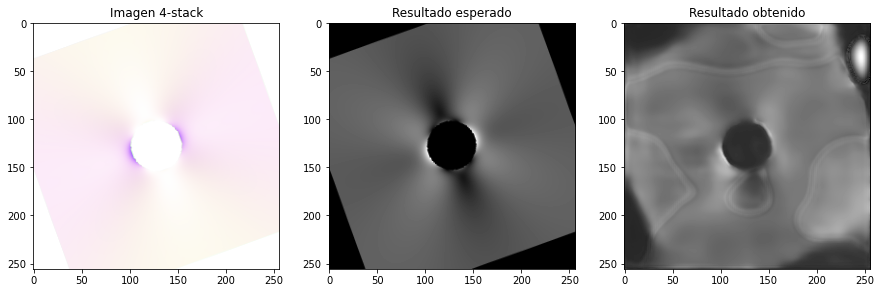

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

227


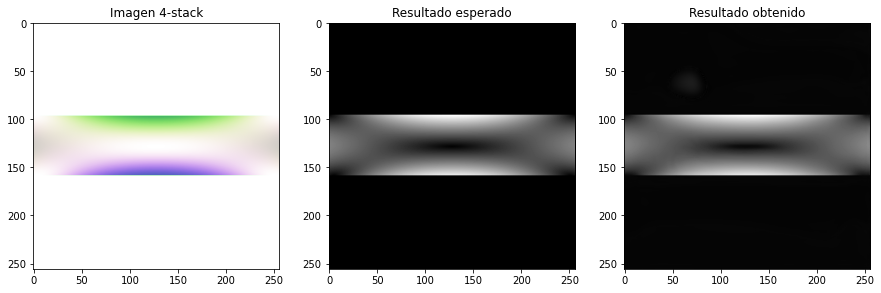

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

53


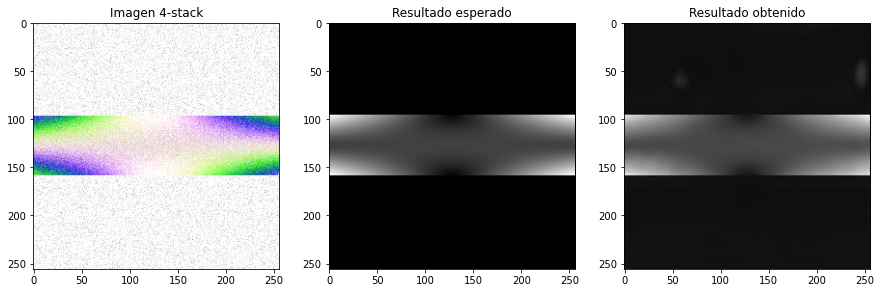

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

120


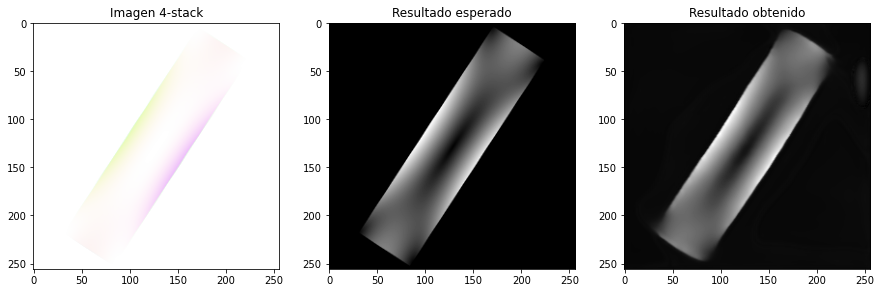

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

401


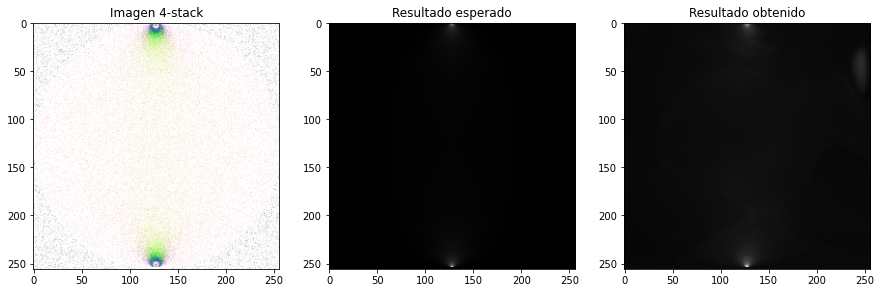

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

**Model8_100e_4b_256_15000**

425


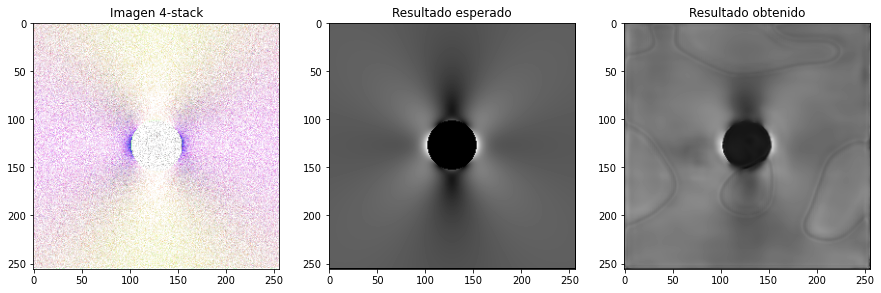

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

448


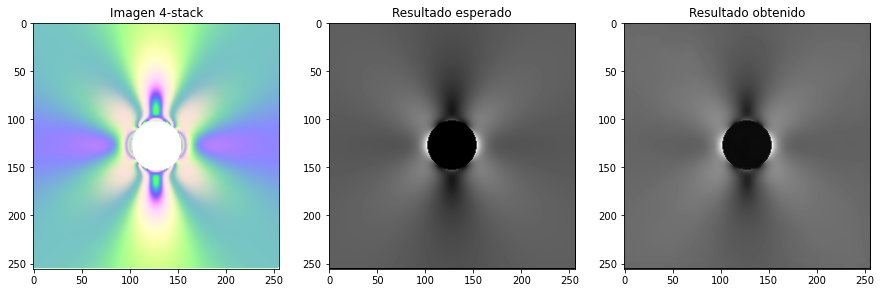

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

561


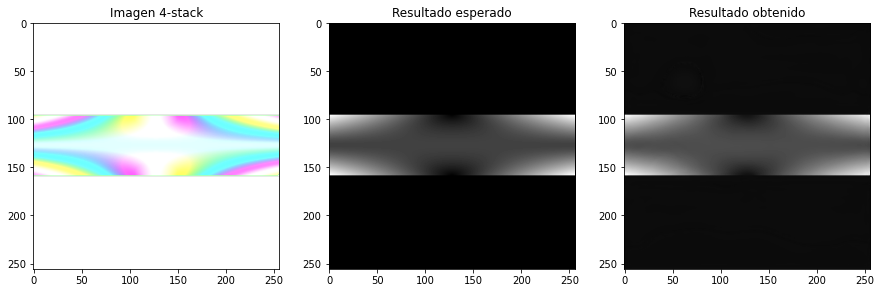

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

465


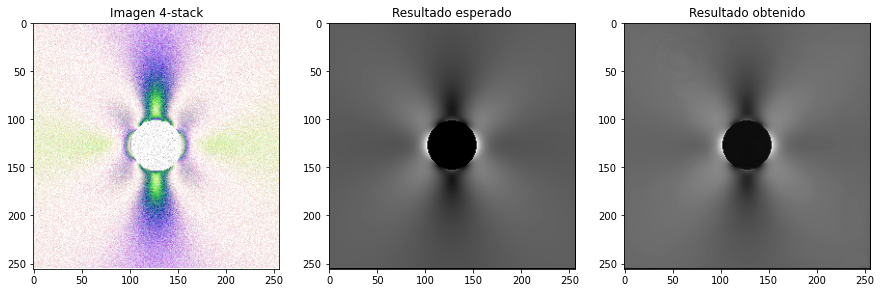

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

268


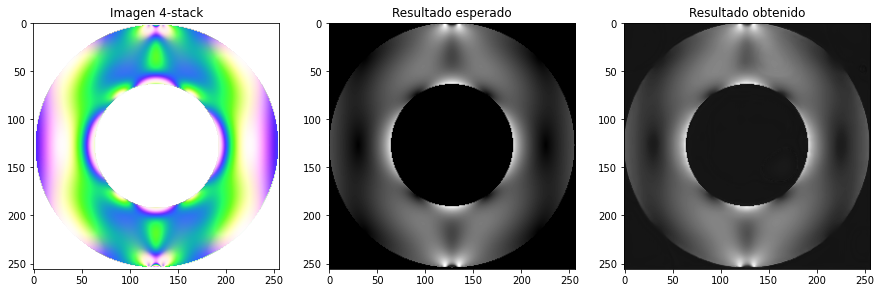

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

**Model8_100e_4b_256_17500**

535


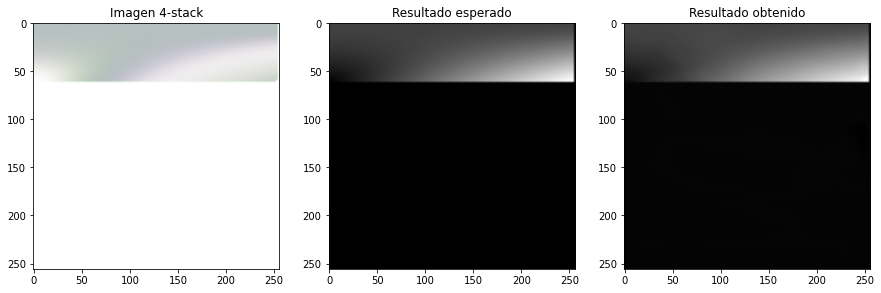

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

566


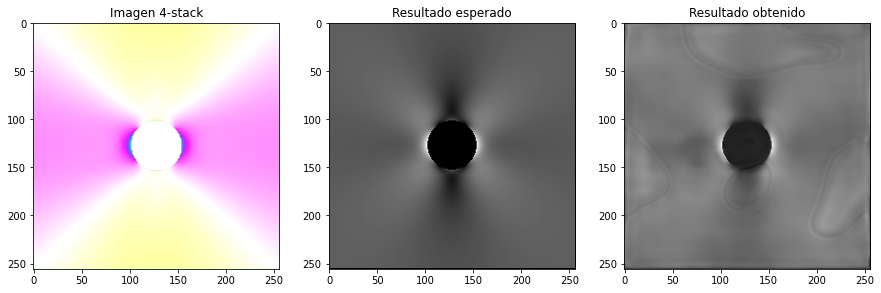

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

337


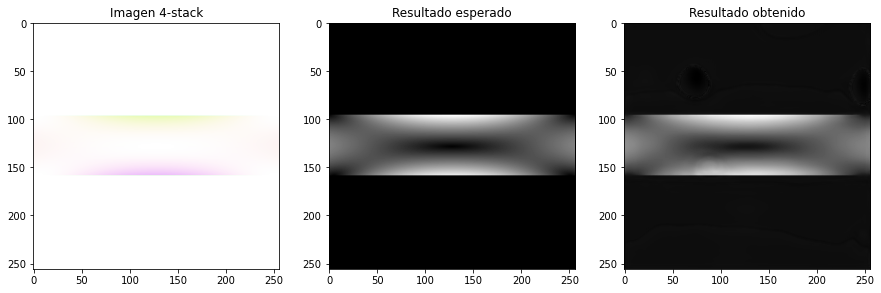

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

159


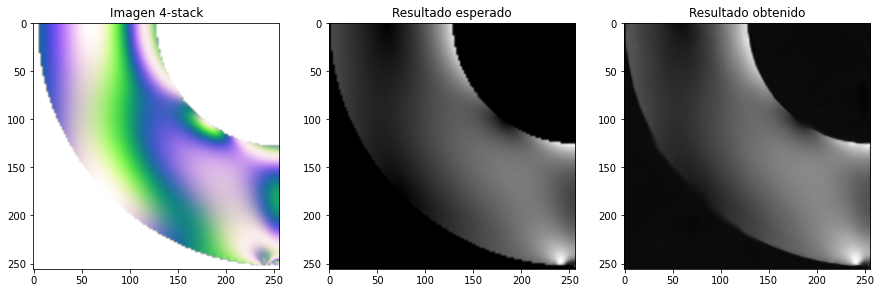

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

573


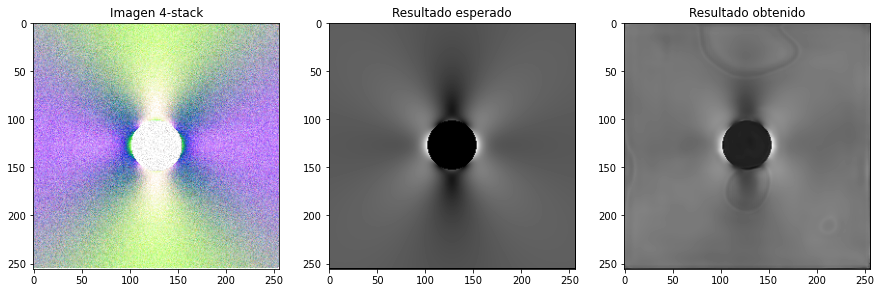

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

**Model8_100e_4b_256_20000**

437


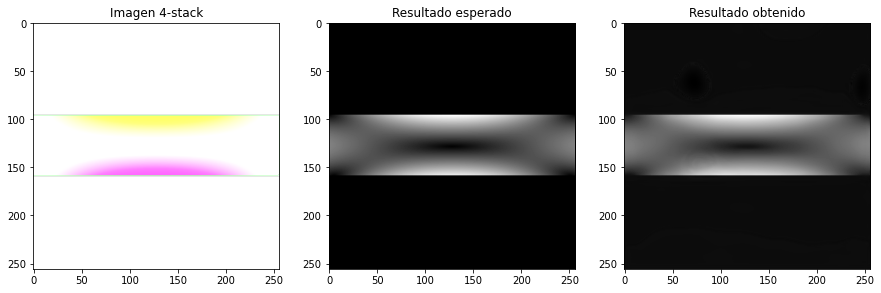

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

609


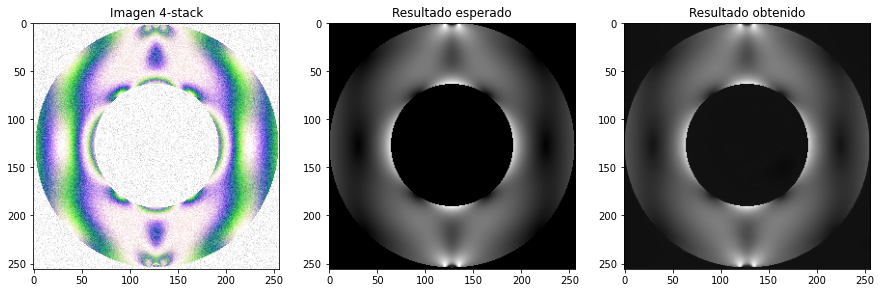

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

71


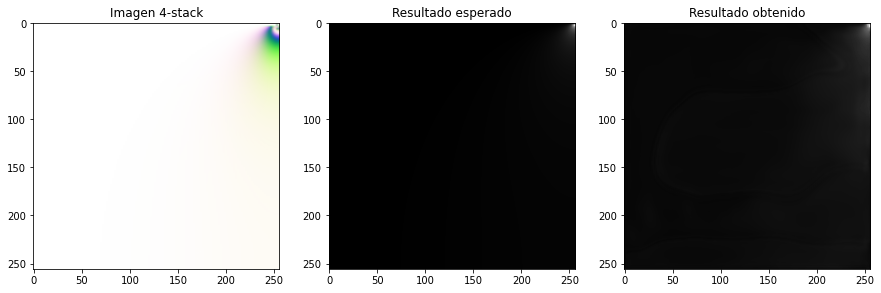

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

426


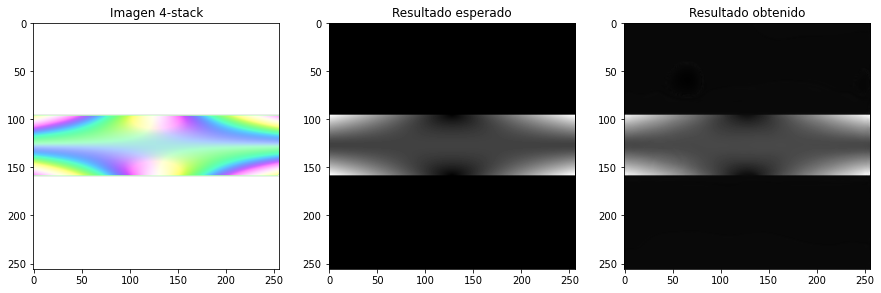

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

468


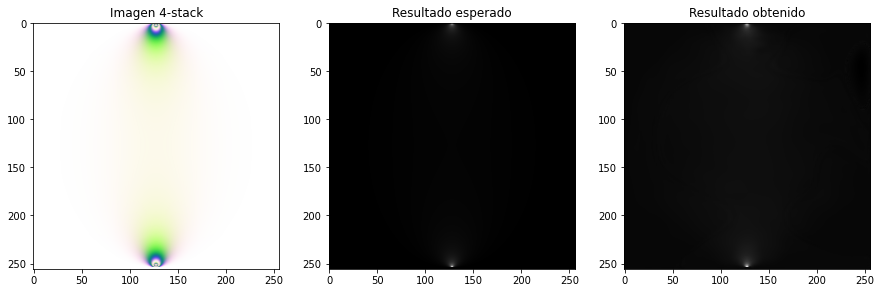

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

**Model8_100e_4b_256_22500**

222


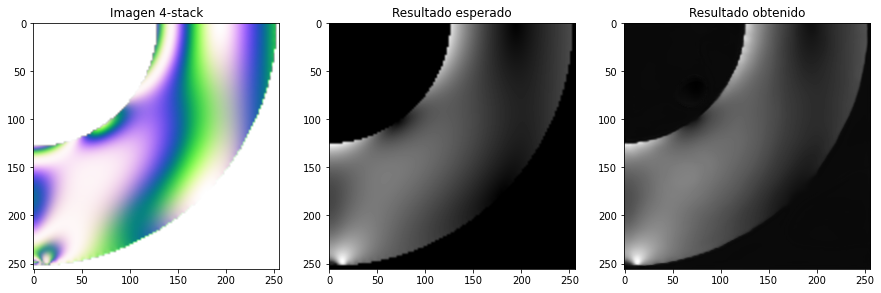

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

9


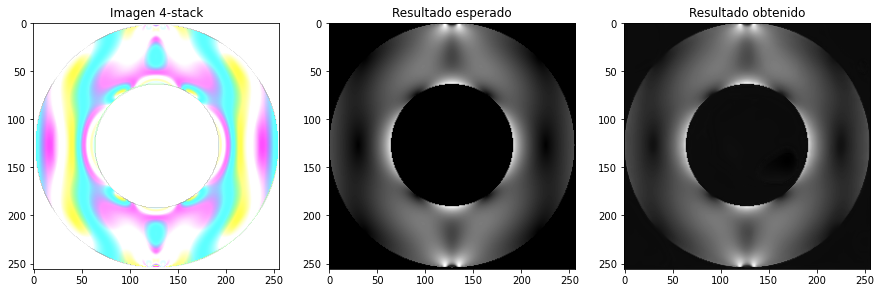

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

587


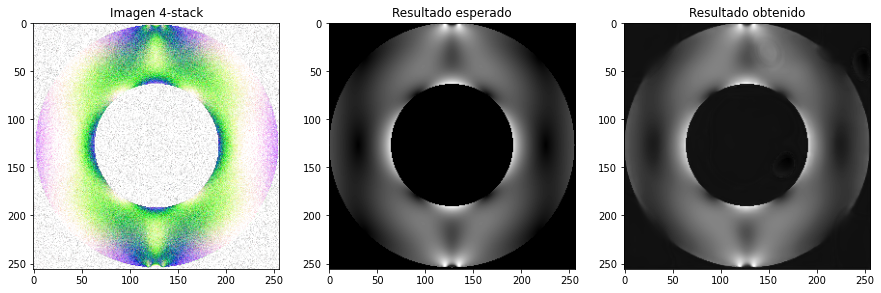

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

466


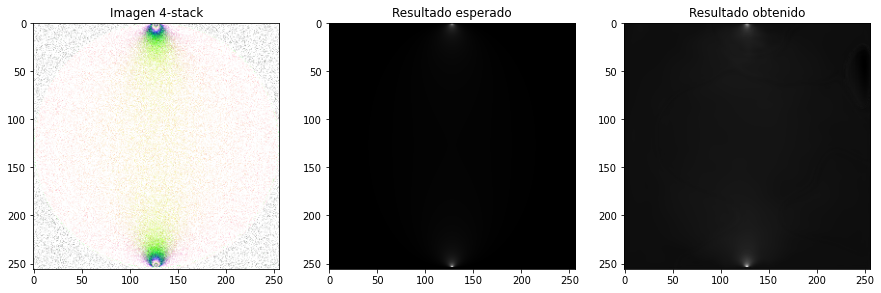

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

**Model8_100e_4b_256_25000**

547


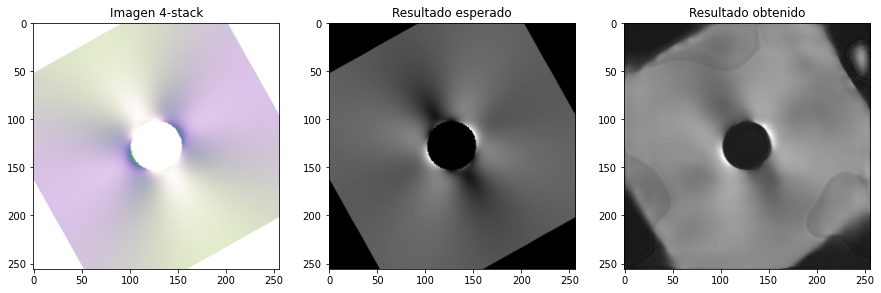

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

382


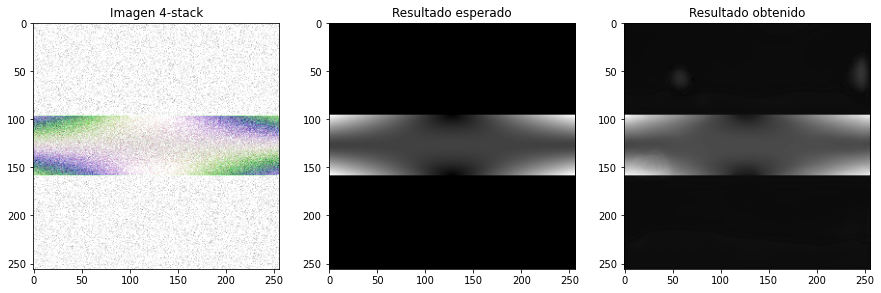

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

556


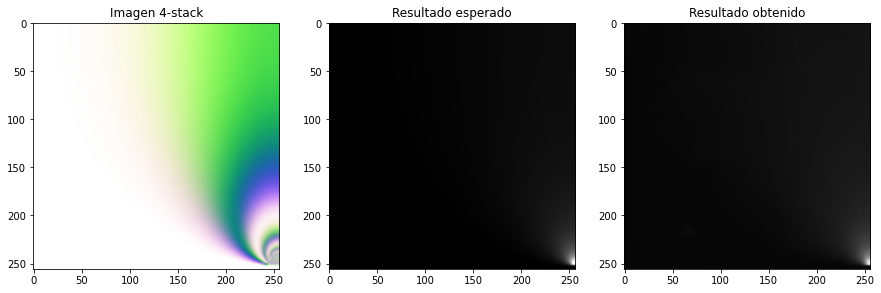

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

414


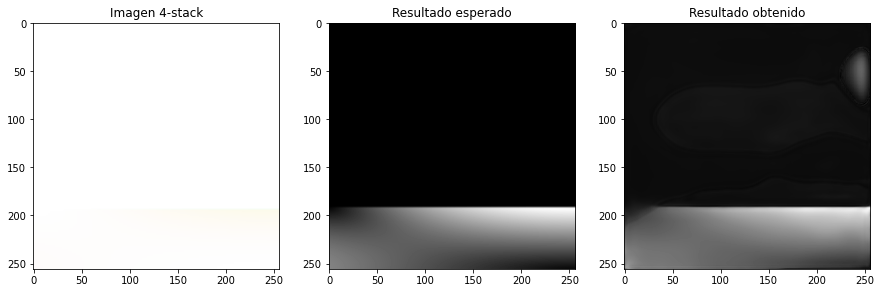

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

**Model8_100e_4b_256_27500**

75


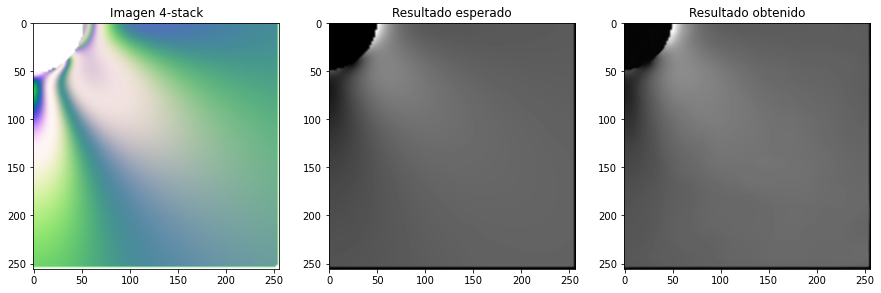

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

404


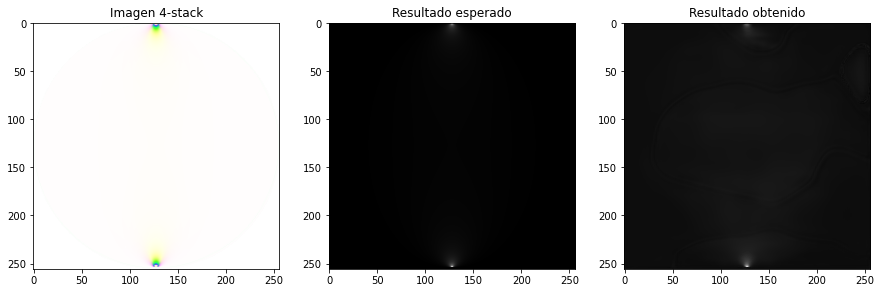

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

609


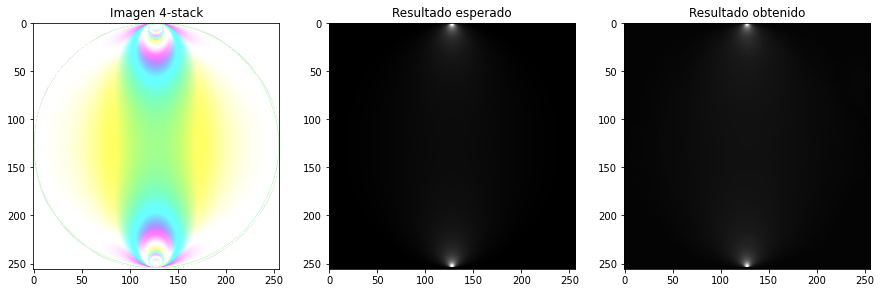

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

467


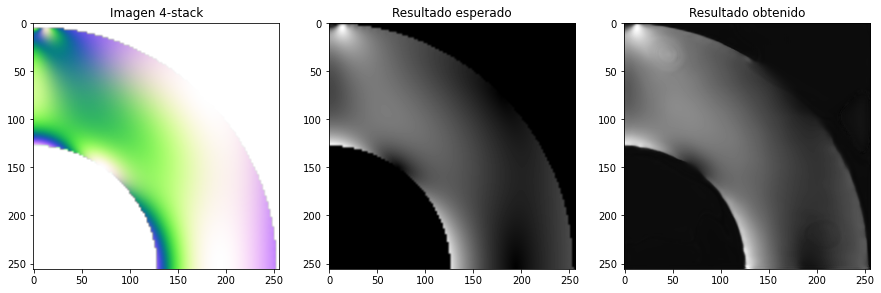

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

**Model8_100e_4b_256_30000**

439


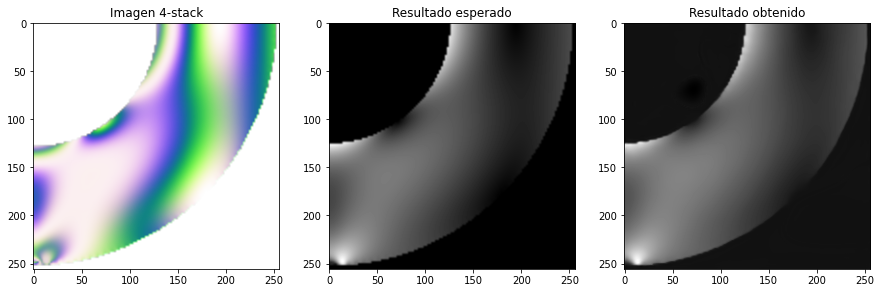

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

269


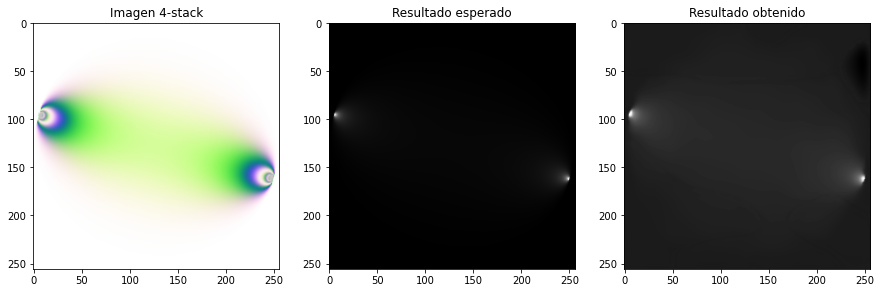

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

412


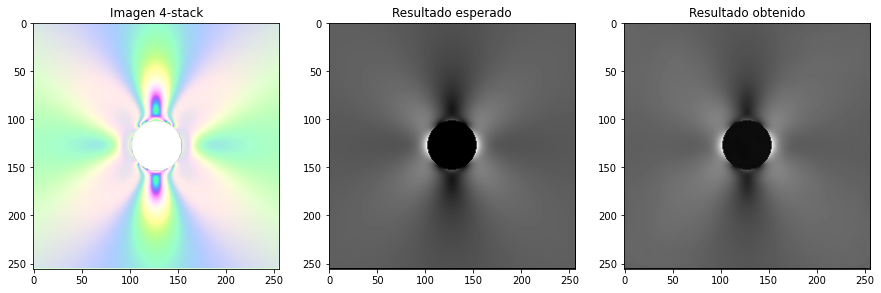

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

223


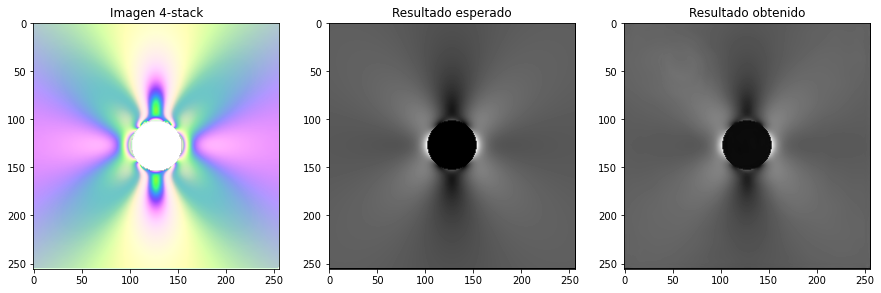

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

**Model8_100e_4b_256_32500**

283


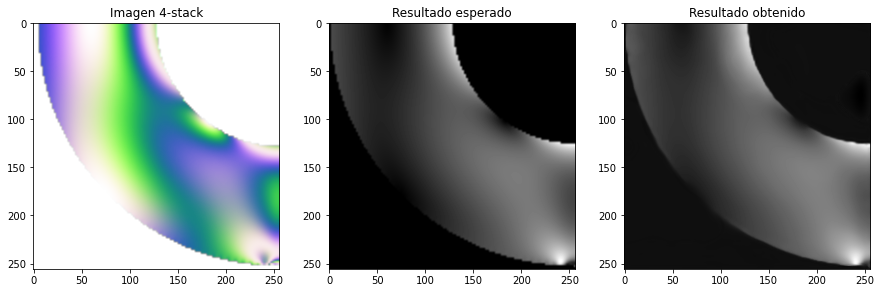

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

498


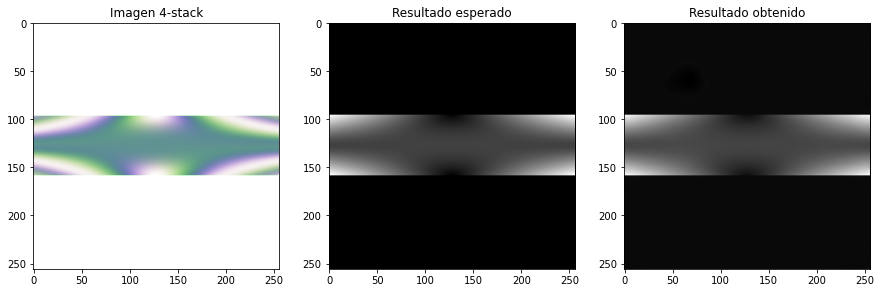

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

415


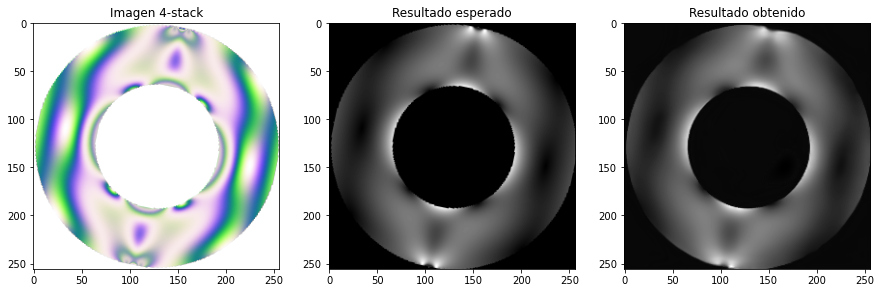

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

273


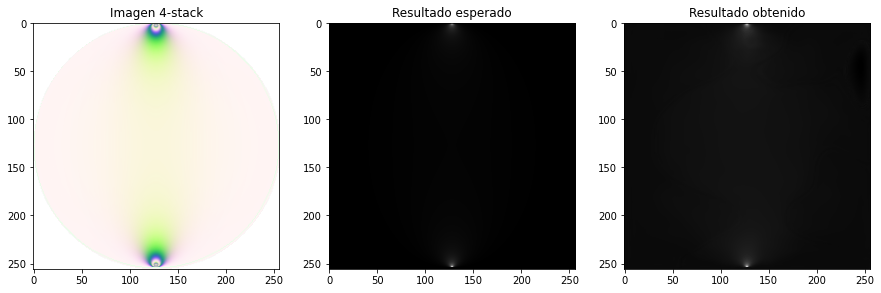

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

**Model8_100e_4b_256_35000**

459


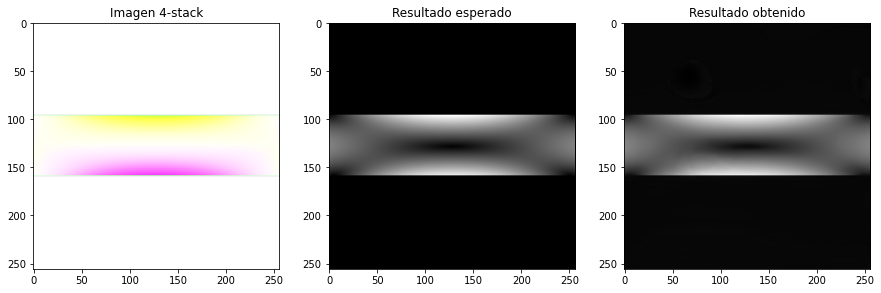

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

208


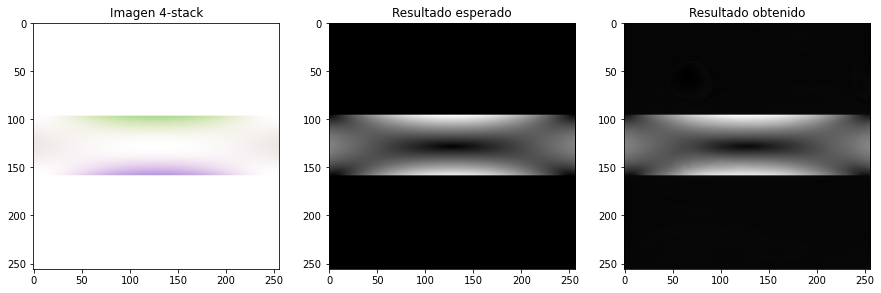

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

603


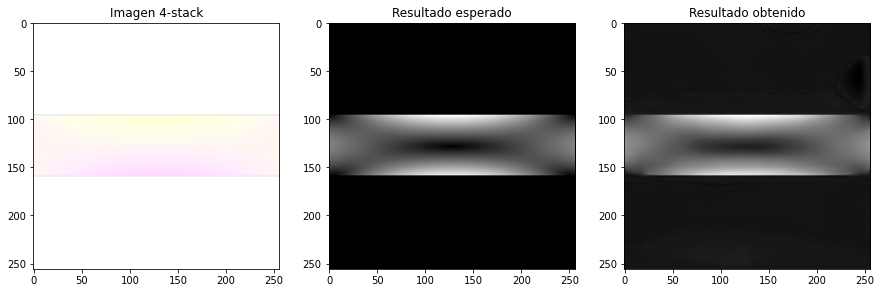

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

50


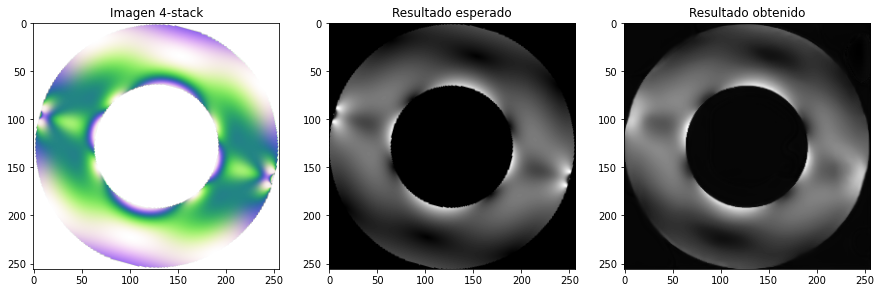

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

**Model8_100e_4b_256_36000**

14


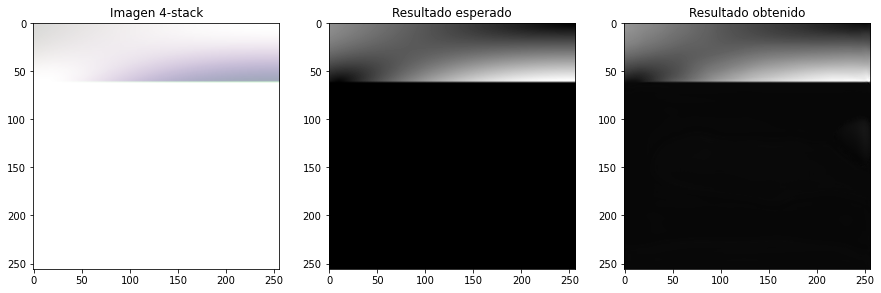

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

99


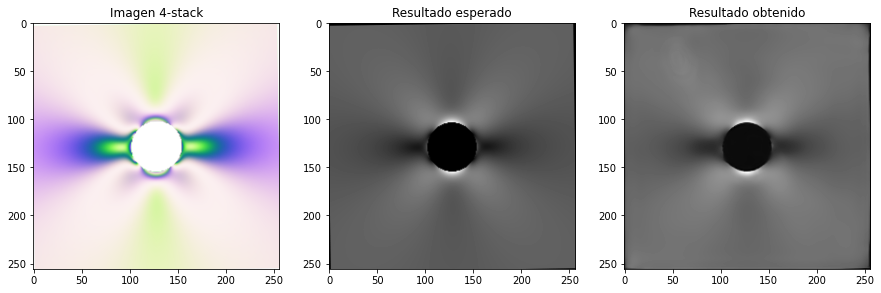

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

45


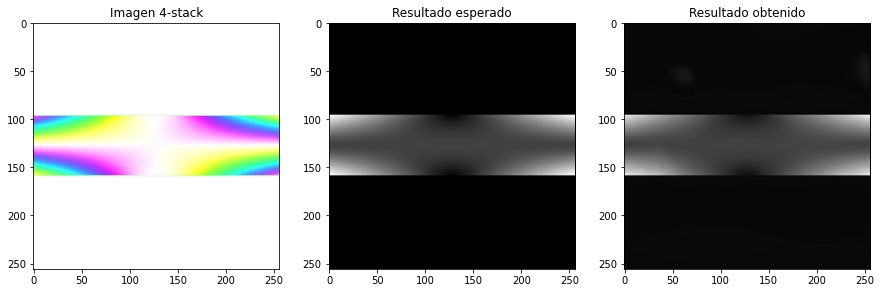

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

247


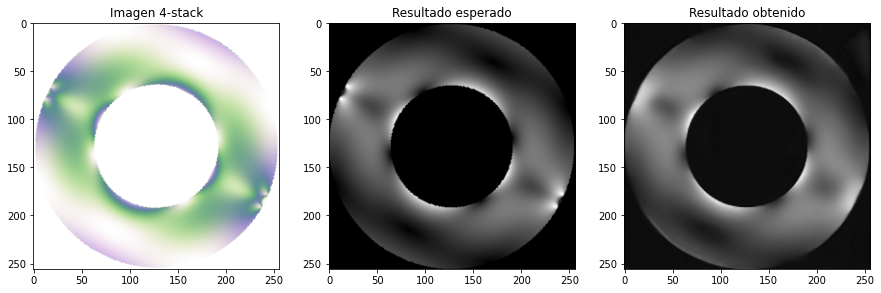

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

## **Métricas MSE, SSIM y PSNR Promedio por modelo**

In [ ]:
pip install git+https://github.com/chaofengc/IQA-PyTorch.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/chaofengc/IQA-PyTorch.git to /tmp/pip-req-build-dunzouv3
  Running command git clone --filter=blob:none --quiet https://github.com/chaofengc/IQA-PyTorch.git /tmp/pip-req-build-dunzouv3
  Resolved https://github.com/chaofengc/IQA-PyTorch.git to commit 0afec469398488cc97140e7708d8e662c52875b6
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-install-kw0kq7ow/clip_460679206c194e16bb5f56b535ae2b36
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-install-kw0kq7ow/clip_460679206c194e16bb5f56b535ae2b36
  Resolved https://github.com/openai/CLIP.git to commit 3702849800aa56e2223035bccd1c6ef91c704ca8
  Preparing metadata (setup.py) ... done


In [ ]:
pip install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pyiqa
import torch

# list all available metrics
print(pyiqa.list_models())

['ahiq', 'brisque', 'ckdn', 'clipiqa', 'clipiqa+', 'cnniqa', 'cw_ssim', 'dbcnn', 'dists', 'fid', 'fsim', 'gmsd', 'ilniqe', 'lpips', 'lpips-vgg', 'mad', 'maniqa', 'ms_ssim', 'musiq', 'musiq-ava', 'musiq-koniq', 'musiq-paq2piq', 'musiq-spaq', 'nima', 'nima-vgg16-ava', 'niqe', 'nlpd', 'nrqm', 'paq2piq', 'pi', 'pieapp', 'psnr', 'psnry', 'ssim', 'ssimc', 'vif', 'vsi']


#### **Función de cómputo de métricas**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
import pyiqa
import torch

def metrics(model, url, bs):

  # Llamar métricas
  brisque = pyiqa.create_metric('brisque')
  dbcnn = pyiqa.create_metric('dbcnn')
  nima = pyiqa.create_metric('nima')
  nrqm = pyiqa.create_metric('nrqm')
  ckdn = pyiqa.create_metric('ckdn')
  dists = pyiqa.create_metric('dists')
  lpips = pyiqa.create_metric('lpips')

  # Prediccion
  model = read_model(model, url, bs)
  y_pred = model.predict(S_test, batch_size=bs)

  # ----- Creacion Arrays ------
  # Metricas tradicionales
  mse_array = np.array([])
  ssim_array = np.array([])
  psnr_array = np.array([])

  # Metricas No Reference
  brisque_array = np.array([])
  dbcnn_array = np.array([])
  nima_array = np.array([])
  nrqm_array = np.array([])

  # Metricas Full Reference
  ckdn_array = np.array([])
  dists_array = np.array([])
  lpips_array = np.array([])

  for i in range(S_test.shape[0]):

    #  Nomenclatura resultados
    exp = P_test[i][:,:,0]
    pred = y_pred[i][:,:,0]

    # Procesamiento para metricas de iqa
    new_arr1 = np.expand_dims(y_pred[i], 0)
    new_arr2 = np.expand_dims(P_test[i], 0)
    new_arr1 = new_arr1.reshape((1,1,256,256))
    new_arr2 = new_arr2.reshape((1,1,256,256))
    tensor1 = torch.from_numpy(new_arr1)
    tensor2 = torch.from_numpy(new_arr2)

    # -------------- Calculo de metricas -------------------------
    # Metricas tradicionales
    mse_res = mse(exp, pred)
    ssim_res = ssim(exp, pred, data_range=pred.max() - pred.min())
    psnr_res = psnr(exp, pred, data_range=pred.max() - pred.min())

    # Metricas No Reference
    brisque_res = brisque(tensor1).item()
    dbcnn_res = dbcnn(tensor1).item()
    nima_res = nima(tensor1).item()
    nrqm_res = nrqm(tensor1).item()

    # Metricas Full Reference
    ckdn_res = ckdn(tensor1, tensor2).item()
    dists_res = dists(tensor1, tensor2).item()
    lpips_res = lpips(tensor1, tensor2).item()

    # -------------- Almacenamiento de metricas -------------------------
    # Metricas tradicionales
    mse_array = np.append(mse_array, mse_res)
    ssim_array = np.append(ssim_array, ssim_res)
    psnr_array = np.append(psnr_array, psnr_res)

    # Metricas No Reference
    brisque_array = np.append(brisque_array, brisque_res)
    dbcnn_array = np.append(dbcnn_array, dbcnn_res)
    nima_array = np.append(nima_array, nima_res)
    nrqm_array = np.append(nrqm_array, nrqm_res)

    # Metricas Full Reference
    ckdn_array = np.append(ckdn_array, ckdn_res)
    dists_array = np.append(dists_array, dists_res)
    lpips_array = np.append(lpips_array, lpips_res)

    print('\r' + str(i), end='')

  # ----------- Imprimir valores ------------------------
  print('--------Metricas tradicionales----------')
  print('Mean MSE: ' + repr(mse_array.mean()))
  print('Std. Dev MSE: ' + repr(mse_array.std()))
  print('Mean SSIM: ' + repr(ssim_array.mean()))
  print('Std. Dev SSIM: ' + repr(ssim_array.std()))
  print('Mean PSNR: ' + repr(psnr_array.mean()))
  print('Std. Dev PSNR: ' + repr(psnr_array.std()))
  print('--------Metricas No Reference----------')
  print('Mean Brisque: ' + repr(brisque_array.mean()))
  print('Std. Dev Brisque: ' + repr(brisque_array.std()))
  print('Mean DBCNN: ' + repr(dbcnn_array.mean()))
  print('Std. Dev DBCNN: ' + repr(dbcnn_array.std()))
  print('Mean nima: ' + repr(nima_array.mean()))
  print('Std. Dev nima: ' + repr(nima_array.std()))
  print('Mean nrqm: ' + repr(nrqm_array.mean()))
  print('Std. Dev nrqm: ' + repr(nrqm_array.std()))
  print('--------Metricas Full Reference----------')
  print('Mean ckdn: ' + repr(ckdn_array.mean()))
  print('Std. Dev ckdn: ' + repr(ckdn_array.std()))
  print('Mean dists: ' + repr(dists_array.mean()))
  print('Std. Dev dists: ' + repr(dists_array.std()))
  print('Mean lpips: ' + repr(lpips_array.mean()))
  print('Std. Dev lpips: ' + repr(lpips_array.std()))

  #Show one example
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True, sharey=True)
  ax = axes.ravel()

  #Original image
  mse_none = mse(exp, exp)
  ssim_none = ssim(exp, exp, data_range=exp.max() - exp.min())
  psnr_none = psnr(exp, exp, data_range=exp.max() - exp.min())
  #Result image
  ssim_res = ssim(exp, pred, data_range=pred.max() - pred.min())
  psnr_res = psnr(exp, pred, data_range=pred.max() - pred.min())

  ax[0].imshow(exp, cmap='gray')
  ax[0].set_xlabel(f'MSE: {mse_none:.2f}, SSIM: {ssim_none:.7f}, PSNR: {psnr_none:.2f}')
  ax[0].set_title('Expected image')

  ax[1].imshow(pred, cmap='gray')
  ax[1].set_xlabel(f'MSE: {mse_res:.8f}, SSIM: {ssim_res:.2f}, PSNR: {psnr_res:.2f}')
  ax[1].set_title('Result image')

  plt.tight_layout()
  plt.show()

  return mse_array.mean(), mse_array.std(), ssim_array.mean(), ssim_array.std(), psnr_array.mean(), psnr_array.std(), brisque_array.mean(), brisque_array.std(), dbcnn_array.mean(), dbcnn_array.std(), nima_array.mean(), nima_array.std(), nrqm_array.mean(), nrqm_array.std(), ckdn_array.mean(), ckdn_array.std(), dists_array.mean(), dists_array.std(), lpips_array.mean(), lpips_array.std()

#### **Model8_100e_4b_256_2500**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/inception_resnet_v2-940b1cd6.pth" to /root/.cache/torch/hub/checkpoints/inception_resnet_v2-940b1cd6.pth


Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_InceptionV2_ava-b0c77c00.pth" to /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth



  0%|          | 0.00/208M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
125/125 [==============================] - 12s 90ms/step
499--------Metricas tradicionales----------
Mean MSE: 0.0004065278588067802
Std. Dev MSE: 0.0007491448307312485
Mean SSIM: 0.7843184418956628
Std. Dev SSIM: 0.20087498678711596
Mean PSNR: 30.404746397480384
Std. Dev PSNR: 6.07740057052701
--------Metricas No Reference----------
Mean Brisque: 101.76698291015624
Std. Dev Brisque: 10.829148022986143
Mean DBCNN: 39.7451189956665
Std. Dev DBCNN: 5.743101954168951
Mean nima: 4.719452742099762
Std. Dev nima: 0.9107929635559661
Mean nrqm: 2.7287195026874542
Std. Dev nrqm: 0.5674320478884528
--------Metricas Full Reference----------
Mean ckdn: 0.5182430374622345
Std. Dev ckdn: 0.022753276561592786
Mean dists: 0.17546536231040955
Std. Dev dists: 0.06515864912769974
Mean lpips: 0.039753067834069955
Std. Dev lpips: 0.033370517125741975


/usr/local/lib/python3.8/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


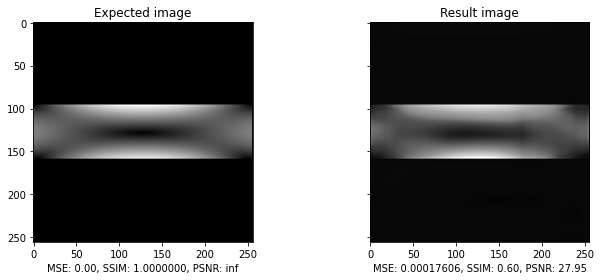

In [ ]:
metrics2000 = metrics(get_saltos(), 'UNetSaltos_100e_4b_256_2000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics2000).T
df.columns = cs
df.to_excel('MetricasUNetSaltos_2000.xlsx')

**Model8_100e_4b_256_5000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_VGG16_ava-dc4e8265.pth" to /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth



  0%|          | 0.00/56.2M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
157/157 [==============================] - 15s 91ms/step
624--------Metricas tradicionales----------
Mean MSE: 0.0006159037372787244
Std. Dev MSE: 0.0010198961765360913
Mean SSIM: 0.9224077902828108
Std. Dev SSIM: 0.1635871785072949
Mean PSNR: 31.867085275909815
Std. Dev PSNR: 7.879970831536029
--------Metricas No Reference----------
Mean Brisque: 108.00798740234374
Std. Dev Brisque: 5.646941991059654
Mean DBCNN: 41.40428369750977
Std. Dev DBCNN: 5.349865513066386
Mean nima: 4.851768087768555
Std. Dev nima: 0.7696963026749836
Mean nrqm: 2.9796890148162842
Std. Dev nrqm: 0.6567748442007079
--------Metricas Full Reference----------
Mean ckdn: 0.5282984694004059
Std. Dev ckdn: 0.01736924093202075
Mean dists: 0.08706617288589477
Std. Dev dists: 0.05863560731465691
Mean lpips: 0.028813028586341535
Std. Dev lpips: 0.0302405269956104


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


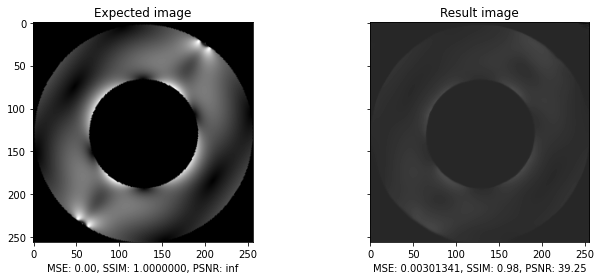

In [ ]:
metrics5000 = metrics(get_stressnet(), 'StressNet4_Principales_100e_4b_256_5000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics5000).T
df.columns = cs
df.to_excel('MetricasStressNet4_Principales_5000.xlsx')

**Model8_100e_4b_256_7500**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_VGG16_ava-dc4e8265.pth" to /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth



  0%|          | 0.00/56.2M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
157/157 [==============================] - 14s 86ms/step
624--------Metricas tradicionales----------
Mean MSE: 0.00046719044629214536
Std. Dev MSE: 0.0008698097935889132
Mean SSIM: 0.9137157311258026
Std. Dev SSIM: 0.17250004795859203
Mean PSNR: 31.19152729698226
Std. Dev PSNR: 9.234516373226155
--------Metricas No Reference----------
Mean Brisque: 107.03603896484375
Std. Dev Brisque: 6.184353398210333
Mean DBCNN: 41.50627283630371
Std. Dev DBCNN: 5.464111717364328
Mean nima: 4.8791120204925535
Std. Dev nima: 0.7701839460574506
Mean nrqm: 2.96783818359375
Std. Dev nrqm: 0.6604613796962405
--------Metricas Full Reference----------
Mean ckdn: 0.527773605298996
Std. Dev ckdn: 0.017276569489214952
Mean dists: 0.0733928334236145
Std. Dev dists: 0.057385051987308436
Mean lpips: 0.024669303973064598
Std. Dev lpips: 0.026405948333311183


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


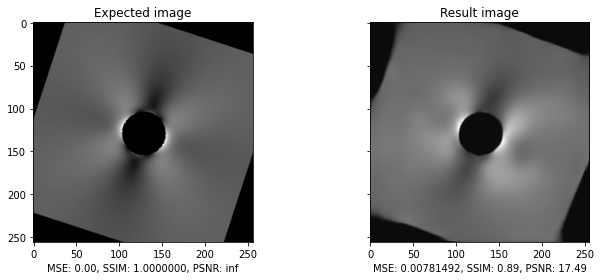

In [ ]:
metrics7500 = metrics(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics7500).T
df.columns = cs
df.to_excel('MetricasStressNet4_Principales_7500.xlsx')

**Model8_100e_4b_256_10000**

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
125/125 [==============================] - 12s 91ms/step
499--------Metricas tradicionales----------
Mean MSE: 0.00029883118648735805
Std. Dev MSE: 0.0008615399396025674
Mean SSIM: 0.9023406920787034
Std. Dev SSIM: 0.14967784168196394
Mean PSNR: 33.47514666667453
Std. Dev PSNR: 7.924856376045624
--------Metricas No Reference----------
Mean Brisque: 104.42375830078124
Std. Dev Brisque: 8.807313895205308
Mean DBCNN: 40.66832691574097
Std. Dev DBCNN: 6.185772672600304
Mean nima: 4.735291949272156
Std. Dev nima: 0.9032930921660978
Mean nrqm: 2.7915731687545775
Std. Dev nrqm: 0.6479320878633608
--------Metricas Full Reference----------
Mean ckdn: 0.5262293711304664
Std. Dev ckdn: 0.017485720356142955
Mean dists: 0.12177590012550354
Std. Dev dists: 0.06150098081565874
Mean lpips: 0.025053923473344186
Std. Dev lpips: 0.03263226051053458


/usr/local/lib/python3.8/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


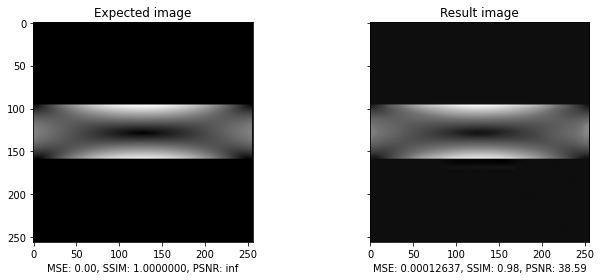

In [ ]:
metrics10000 = metrics(get_saltos(), 'UNetSaltos_100e_4b_256_10000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics10000).T
df.columns = cs
df.to_excel('MetricasUNetSaltos_10000.xlsx')

**Model8_100e_4b_256_12500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.0001443628511674581
Std. Dev MSE: 0.0002261405018728157
Mean SSIM: 0.8981019214407201
Std. Dev SSIM: 0.13406667203566358
Mean PSNR: 34.06506675781628
Std. Dev PSNR: 6.471105062127298
--------Metricas No Reference----------
Mean Brisque: 105.66843896484374
Std. Dev Brisque: 7.494853477156881
Mean DBCNN: 40.633977212524414
Std. Dev DBCNN: 6.798159097293092
Mean nima: 4.891258808517456
Std. Dev nima: 0.7464803569958867
Mean nrqm: 1.9346896896362304
Std. Dev nrqm: 0.06019330646715238
--------Metricas Full Reference----------
Mean ckdn: 0.5330932521820069
Std. Dev ckdn: 0.010744901299701841
Mean dists: 0.08969783096313477
Std. Dev dists: 0.04259567623335016
Mean lpips: 0.01834945917278528
Std. Dev lpips: 0.019675346704660736


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


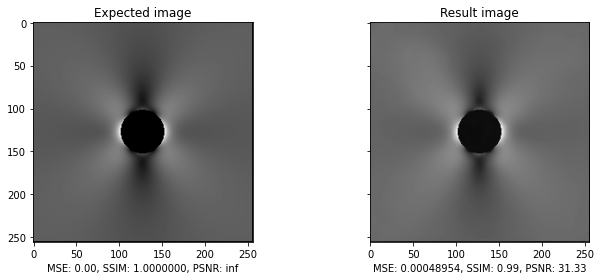

In [ ]:
metrics12500 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics12500).T
df.columns = cs
df.to_excel('MetricasStressNet4_12500.xlsx')

**Model8_100e_4b_256_15000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_VGG16_ava-dc4e8265.pth" to /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth



  0%|          | 0.00/56.2M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 8.567148237326663e-05
Std. Dev MSE: 0.00013117163588611194
Mean SSIM: 0.8606423564865676
Std. Dev SSIM: 0.19553880802546475
Mean PSNR: 35.98486674200809
Std. Dev PSNR: 8.076004934117716
--------Metricas No Reference----------
Mean Brisque: 106.55796435546876
Std. Dev Brisque: 7.18785155609003
Mean DBCNN: 40.83260894165039
Std. Dev DBCNN: 6.51167782762912
Mean nima: 4.810496152877808
Std. Dev nima: 0.7633503942195378
Mean nrqm: 1.9449249172210694
Std. Dev nrqm: 0.0595008549083558
--------Metricas Full Reference----------
Mean ckdn: 0.5360425764560699
Std. Dev ckdn: 0.009791764298901348
Mean dists: 0.06311435089111328
Std. Dev dists: 0.04491156675559907
Mean lpips: 0.01359238615827635
Std. Dev lpips: 0.02047262325458572


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


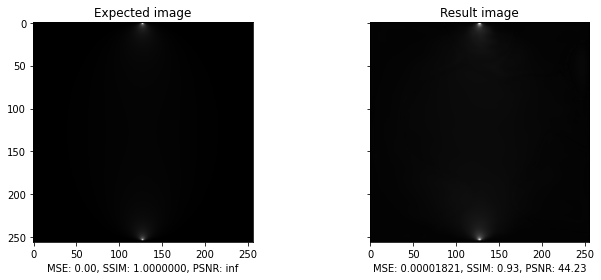

In [ ]:
metrics15000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics15000).T
df.columns = cs
df.to_excel('MetricasStressNet4_15000.xlsx')

**Model8_100e_4b_256_17500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.00010076624779418311
Std. Dev MSE: 0.00020996860930794383
Mean SSIM: 0.9097473627249776
Std. Dev SSIM: 0.14308285920911967
Mean PSNR: 35.5170009140654
Std. Dev PSNR: 7.43934329996857
--------Metricas No Reference----------
Mean Brisque: 105.91229404296875
Std. Dev Brisque: 7.249223861717032
Mean DBCNN: 40.54066844177246
Std. Dev DBCNN: 6.470650153830746
Mean nima: 4.816081107711792
Std. Dev nima: 0.7704536241808616
Mean nrqm: 1.9631343885421753
Std. Dev nrqm: 0.06693356179837874
--------Metricas Full Reference----------
Mean ckdn: 0.5347617254257202
Std. Dev ckdn: 0.010202831018140453
Mean dists: 0.0741211817741394
Std. Dev dists: 0.04073935243077134
Mean lpips: 0.0168897498190403
Std. Dev lpips: 0.022822373262464377


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


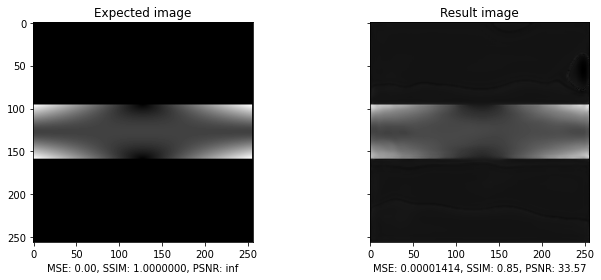

In [ ]:
metrics17500 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics17500).T
df.columns = cs
df.to_excel('MetricasStressNet4_17500.xlsx')

**Model8_100e_4b_256_20000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_VGG16_ava-dc4e8265.pth" to /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth



  0%|          | 0.00/56.2M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 9.378467506496607e-05
Std. Dev MSE: 0.00015189154251777327
Mean SSIM: 0.913234485609826
Std. Dev SSIM: 0.139700297028438
Mean PSNR: 36.79963738249624
Std. Dev PSNR: 7.396225877160593
--------Metricas No Reference----------
Mean Brisque: 105.04182412109375
Std. Dev Brisque: 7.95772410273372
Mean DBCNN: 41.51476553344727
Std. Dev DBCNN: 6.672004103464224
Mean nima: 4.885128581619263
Std. Dev nima: 0.7746484486110495
Mean nrqm: 1.9566718383789063
Std. Dev nrqm: 0.07106366787031484
--------Metricas Full Reference----------
Mean ckdn: 0.5349605681419373
Std. Dev ckdn: 0.010638889182326843
Mean dists: 0.06997155780792236
Std. Dev dists: 0.03966805896826315
Mean lpips: 0.013579025330208242
Std. Dev lpips: 0.01867544149198256


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


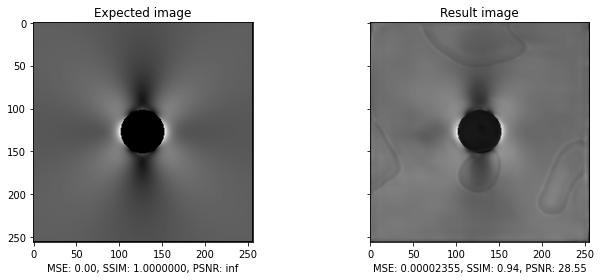

In [ ]:
metrics20000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics20000).T
df.columns = cs
df.to_excel('MetricasStressNet4_20000.xlsx')

**Model8_100e_4b_256_22500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 8.446522909802905e-05
Std. Dev MSE: 0.0001234783881242377
Mean SSIM: 0.9107707029041759
Std. Dev SSIM: 0.13219603924431655
Mean PSNR: 37.15105006162798
Std. Dev PSNR: 7.534992832541595
--------Metricas No Reference----------
Mean Brisque: 104.55470732421875
Std. Dev Brisque: 7.860727205053762
Mean DBCNN: 40.53835631103516
Std. Dev DBCNN: 7.8134149665638235
Mean nima: 4.931213280105591
Std. Dev nima: 0.7772647745378125
Mean nrqm: 1.946140767097473
Std. Dev nrqm: 0.05718975744960383
--------Metricas Full Reference----------
Mean ckdn: 0.5351802940368653
Std. Dev ckdn: 0.010753558861110332
Mean dists: 0.08605121688842773
Std. Dev dists: 0.03630840155230868
Mean lpips: 0.013992254254966974
Std. Dev lpips: 0.019433467148232006


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


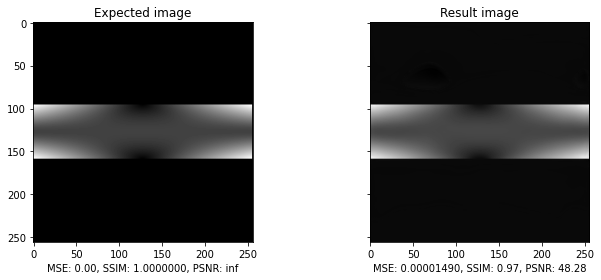

In [ ]:
metrics22500 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics22500).T
df.columns = cs
df.to_excel('MetricasStressNet4_22500.xlsx')

**Model8_100e_4b_256_25000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_VGG16_ava-dc4e8265.pth" to /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth



  0%|          | 0.00/56.2M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 9.212527308260536e-05
Std. Dev MSE: 0.0001112814762335153
Mean SSIM: 0.8547988287738115
Std. Dev SSIM: 0.18216884459159396
Mean PSNR: 35.42156388509228
Std. Dev PSNR: 6.703664885909953
--------Metricas No Reference----------
Mean Brisque: 104.90327568359375
Std. Dev Brisque: 7.5081301879050555
Mean DBCNN: 40.84920507507324
Std. Dev DBCNN: 7.4149685897899005
Mean nima: 4.934352318572998
Std. Dev nima: 0.7550554440168393
Mean nrqm: 1.9361593935012817
Std. Dev nrqm: 0.05836691541360231
--------Metricas Full Reference----------
Mean ckdn: 0.5347219881057739
Std. Dev ckdn: 0.01046791408437187
Mean dists: 0.0885602367401123
Std. Dev dists: 0.040642615897632774
Mean lpips: 0.014444701828435063
Std. Dev lpips: 0.014586105364886479


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


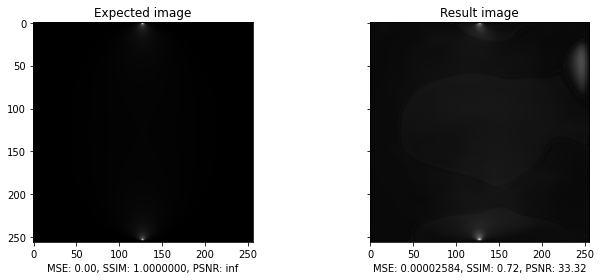

In [ ]:
metrics25000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics25000).T
df.columns = cs
df.to_excel('MetricasStressNet4_25000.xlsx')

**Model8_100e_4b_256_27500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.00010833488132474372
Std. Dev MSE: 0.000263926625781933
Mean SSIM: 0.933376186763922
Std. Dev SSIM: 0.1131808707116122
Mean PSNR: 36.66062852521407
Std. Dev PSNR: 7.388523623668925
--------Metricas No Reference----------
Mean Brisque: 105.98650888671875
Std. Dev Brisque: 7.395725740165177
Mean DBCNN: 41.73758967285156
Std. Dev DBCNN: 7.074367886810301
Mean nima: 4.909679420471192
Std. Dev nima: 0.7933634294659234
Mean nrqm: 1.9507468984603882
Std. Dev nrqm: 0.06387326647555525
--------Metricas Full Reference----------
Mean ckdn: 0.536363598060608
Std. Dev ckdn: 0.010261308377368316
Mean dists: 0.05570073595046997
Std. Dev dists: 0.037699723659899036
Mean lpips: 0.01126430240701884
Std. Dev lpips: 0.015047571204021875


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


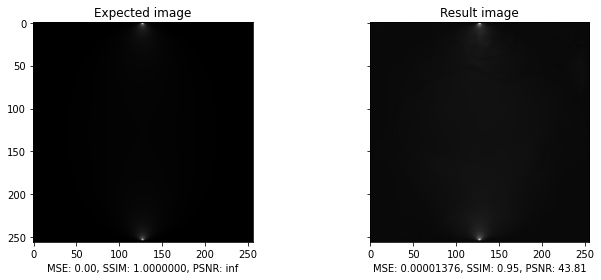

In [ ]:
metrics27500 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics27500).T
df.columns = cs
df.to_excel('MetricasStressNet4_27500.xlsx')

**Model8_100e_4b_256_30000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_VGG16_ava-dc4e8265.pth" to /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth



  0%|          | 0.00/56.2M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.00010229807702936375
Std. Dev MSE: 0.00014536640885286684
Mean SSIM: 0.8788909750100694
Std. Dev SSIM: 0.18838392389814662
Mean PSNR: 35.87575836548977
Std. Dev PSNR: 6.331369546211009
--------Metricas No Reference----------
Mean Brisque: 106.19129130859375
Std. Dev Brisque: 7.240422295533275
Mean DBCNN: 40.47183272094727
Std. Dev DBCNN: 7.559436822746913
Mean nima: 4.901301526641846
Std. Dev nima: 0.7438983281493297
Mean nrqm: 1.944701160621643
Std. Dev nrqm: 0.057937764674531746
--------Metricas Full Reference----------
Mean ckdn: 0.5364356328010559
Std. Dev ckdn: 0.010238177971910345
Mean dists: 0.09030807762145997
Std. Dev dists: 0.04307851430019049
Mean lpips: 0.014458211454749107
Std. Dev lpips: 0.0125429463499345


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


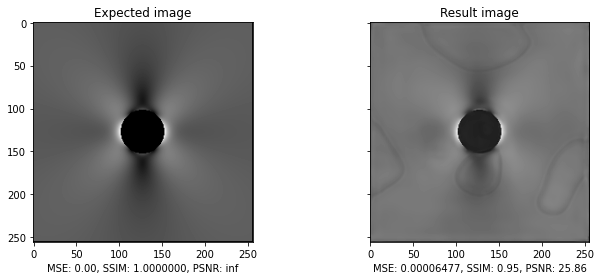

In [ ]:
metrics30000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics30000).T
df.columns = cs
df.to_excel('MetricasStressNet4_30000.xlsx')

**Model8_100e_4b_256_32500**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 0.00010563113229542187
Std. Dev MSE: 0.00017896744661714375
Mean SSIM: 0.9341406808903292
Std. Dev SSIM: 0.10165680959369842
Mean PSNR: 36.690454799548796
Std. Dev PSNR: 6.166621658164036
--------Metricas No Reference----------
Mean Brisque: 105.78743037109375
Std. Dev Brisque: 7.397773869036172
Mean DBCNN: 41.6931538269043
Std. Dev DBCNN: 7.094261214759123
Mean nima: 4.9528809204101565
Std. Dev nima: 0.7620974573513258
Mean nrqm: 1.9703663496017456
Std. Dev nrqm: 0.07076175325472474
--------Metricas Full Reference----------
Mean ckdn: 0.5354840380668641
Std. Dev ckdn: 0.010590339716843027
Mean dists: 0.07231230554580688
Std. Dev dists: 0.03216703085527269
Mean lpips: 0.012396591499447822
Std. Dev lpips: 0.01350375408070364


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


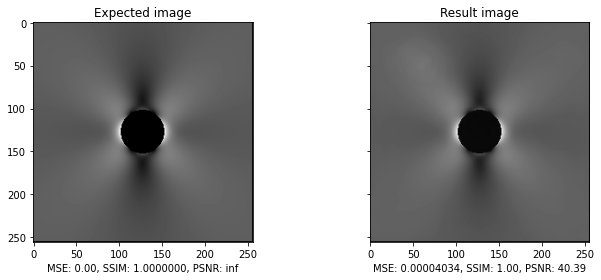

In [ ]:
metrics32500 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics32500).T
df.columns = cs
df.to_excel('MetricasStressNet4_32500.xlsx')

**Model8_100e_4b_256_35000**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
624--------Metricas tradicionales----------
Mean MSE: 6.819271390097504e-05
Std. Dev MSE: 0.00011450980661382342
Mean SSIM: 0.8929347821078248
Std. Dev SSIM: 0.15168549791351243
Mean PSNR: 37.10116906989877
Std. Dev PSNR: 6.878837129956068
--------Metricas No Reference----------
Mean Brisque: 106.25467841796875
Std. Dev Brisque: 7.469150538917779
Mean DBCNN: 40.83015759887695
Std. Dev DBCNN: 7.087456700667646
Mean nima: 4.8833877571105955
Std. Dev nima: 0.7569810077588334
Mean nrqm: 1.9655812749862671
Std. Dev nrqm: 0.0675653634977534
--------Metricas Full Reference----------
Mean ckdn: 0.5354337431907654
Std. Dev ckdn: 0.010777719618458671
Mean dists: 0.06386264562606811
Std. Dev dists: 0.033817503413572786
Mean lpips: 0.011436345425061882
Std. Dev lpips: 0.015769774159684787


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


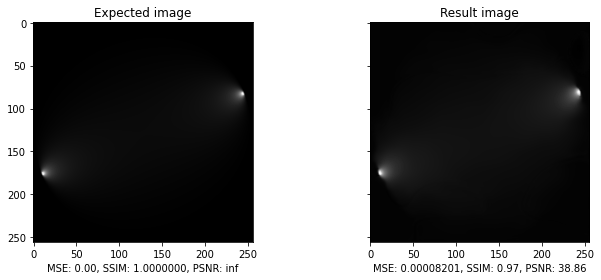

In [ ]:
metrics35000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics35000).T
df.columns = cs
df.to_excel('MetricasStressNet4_35000.xlsx')

**Model8_100e_4b_256_36000**

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_VGG16_ava-dc4e8265.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
249--------Metricas tradicionales----------
Mean MSE: 7.080296084104833e-05
Std. Dev MSE: 9.530981556642218e-05
Mean SSIM: 0.8994591120571767
Std. Dev SSIM: 0.16033757430784698
Mean PSNR: 36.875193212778434
Std. Dev PSNR: 6.991165678962446
--------Metricas No Reference----------
Mean Brisque: 105.75892333984375
Std. Dev Brisque: 7.223070884509136
Mean DBCNN: 42.65725351715088
Std. Dev DBCNN: 7.184304979870575
Mean nima: 5.008847256660461
Std. Dev nima: 0.7691613118421238
Mean nrqm: 1.9614013924598694
Std. Dev nrqm: 0.05988445847333713
--------Metricas Full Reference----------
Mean ckdn: 0.537316953420639
Std. Dev ckdn: 0.010446681274589375
Mean dists: 0.05918568277359009
Std. Dev dists: 0.03260284905122079
Mean lpips: 0.009734895794652403
Std. Dev lpips: 0.01191690330753712


/usr/local/lib/python3.7/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


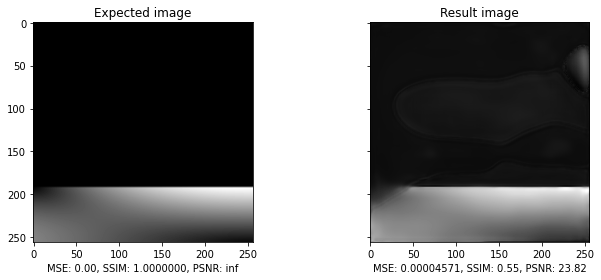

In [ ]:
metrics36000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics36000).T
df.columns = cs
df.to_excel('MetricasStressNet4_36000.xlsx')

**Predicción sobre imágenes externas**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse

def predict(arq, model_url, bs, image):
  model = read_model(arq, model_url, bs)
  image = np.expand_dims(np.load('/content/drive/My Drive/Tesis/SeleccionJhonatan2/Disco/Stack1234/'+ str(image) + '.npy'), axis=0)
  image = image/255
  pred = model.predict(image, batch_size=bs)
  pred = np.reshape(pred, (256, 256))

  #Show result
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True, sharey=True)
  ax = axes.ravel()

  #Predicted image
  ax[0].imshow(np.reshape(image,(256,256,4)), cmap='gray')
  ax[0].set_title('Original image')

  #Original image
  ax[1].imshow(pred, cmap='gray')
  ax[1].set_title('Predicted image')

  plt.tight_layout()
  plt.show()

# **Anillo**

**Modelo 2**

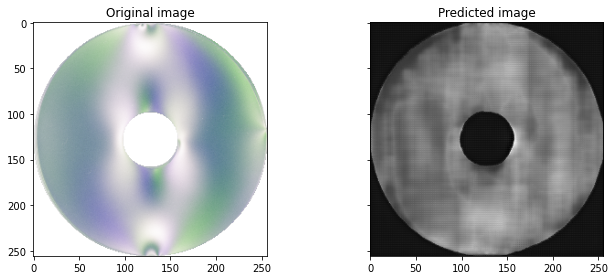

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 500)

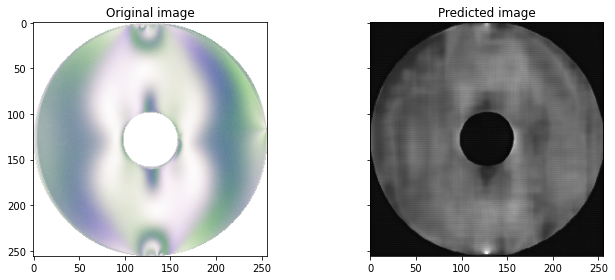

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1000)

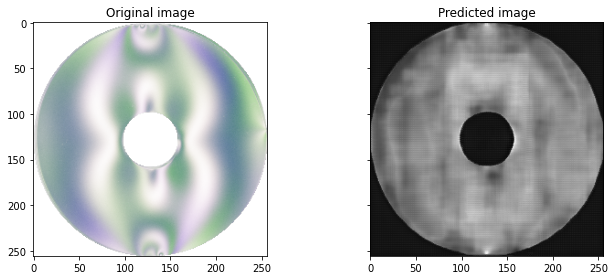

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1500)

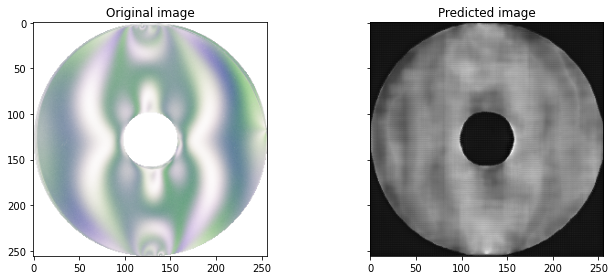

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 2000)

**Modelo 8**

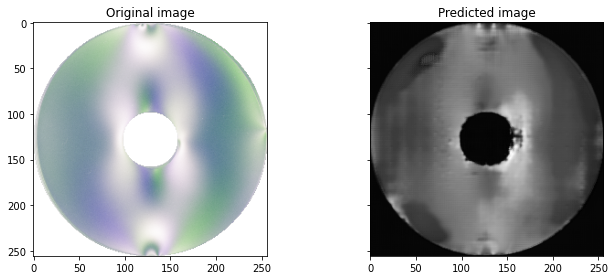

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 500)

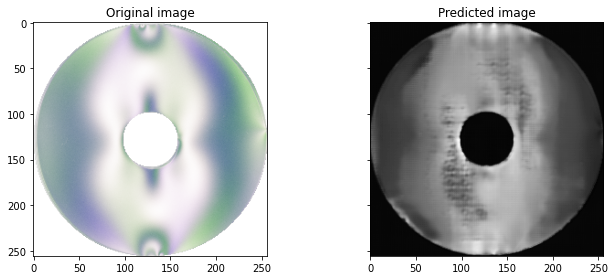

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1000)

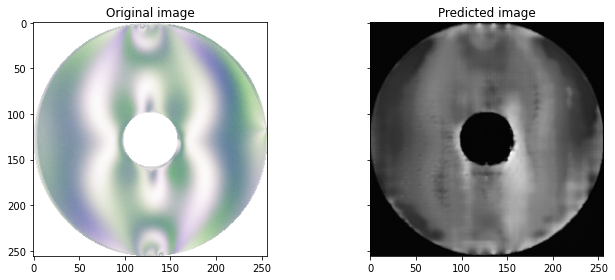

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1500)

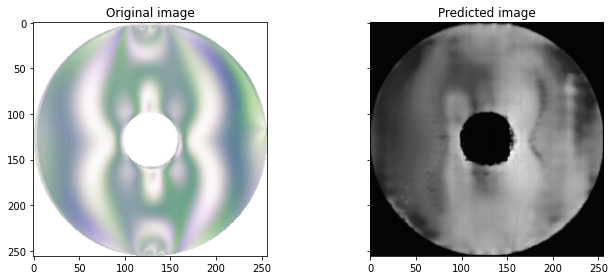

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 2000)

---

# **Disco**

**Modelo 2**

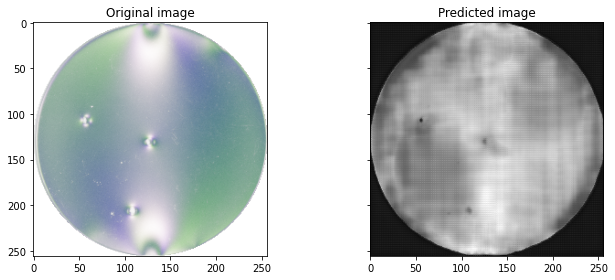

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 500)

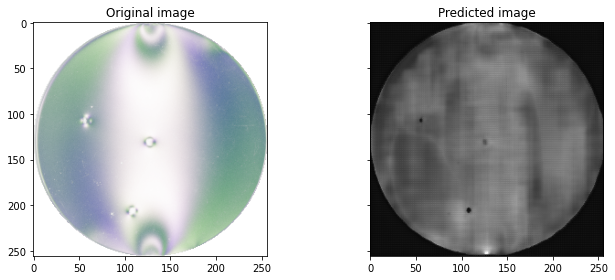

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1000)

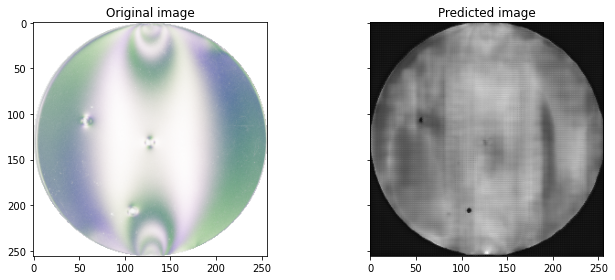

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1500)

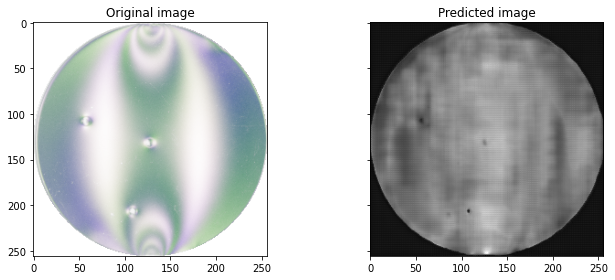

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 2000)

**Modelo 8**

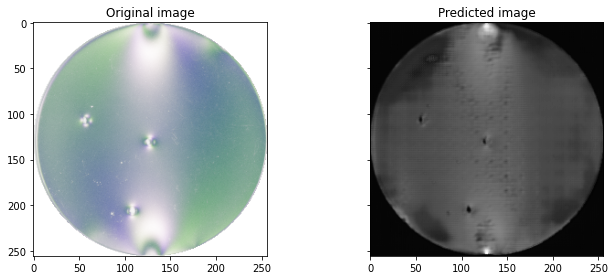

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 500)

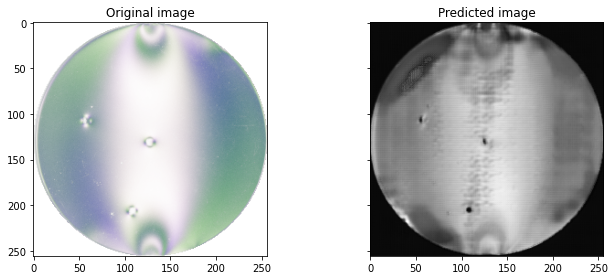

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1000)

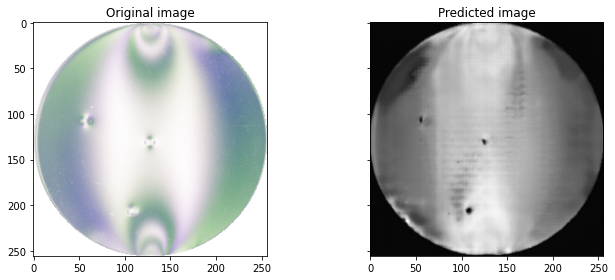

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1500)

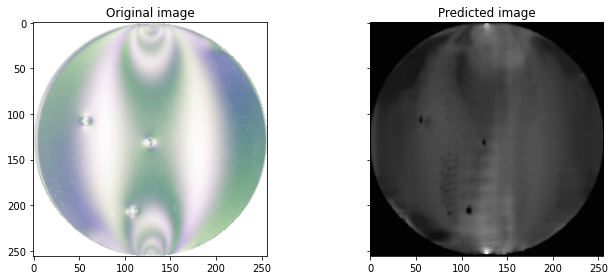

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 2000)